# AOS AuxTel test data

Setup:

    ssh -L 54467:localhost:54467 scichris@lsst-devl02
    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib
    source /project/scichris/aos/setup_aos_current.sh
    jupyter notebook --no-browser --port=54467

Use data from : `211104` , log https://confluence.lsstcorp.org/display/LSSTCOM/2021-11-04+Aux-Tel+Night+Log and pdf with notebook used to run the telescope https://confluence.lsstcorp.org/download/attachments/168857232/Donut_5s_intra_extra.pdf?version=1&modificationDate=1636081198000&api=v2

Run the ISR:
    
    ssh lsst-devl02

    source "/software/lsstsw/stack/loadLSST.bash"
    setup lsst_distrib

https://pipelines.lsst.io/v/weekly/modules/lsst.daf.butler/queries.html#dimension-expressions

    pipetask run  --data-query "exposure IN (2021110400299..2021110400358) AND instrument='LATISS' " -b /repo/main/butler.yaml --input  LATISS/raw/all,LATISS/calib,u/czw/DM-28920/calib.20210720  --output u/scichris/Latiss/postISRtest --pipeline /project/scichris/aos/testLatiss4.yaml  --register-dataset-types
   
   
When I try to run that I get 

    FileNotFoundError: Not enough datasets (0) found for non-optional connection isr.flat (flat) with minimum=1 for quantum data ID {instrument: 'LATISS', detector: 0, exposure: 2021110400299, ...}
    
So I try to run with `doApplyGains` rather than `doFlat` : 

    pipetask run  --data-query "exposure IN (2021110400299..2021110400358) AND instrument='LATISS' " -b /repo/main/butler.yaml --input  LATISS/raw/all,LATISS/calib,u/czw/DM-28920/calib.20210720  --output u/scichris/Latiss/postISRtest --pipeline /project/scichris/aos/testLatiss4_noFlat.yaml  --register-dataset-types


In [6]:
%matplotlib inline
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt
import numpy as np 
from lsst.daf import butler as dafButler


def preview_auxtel_exposures(year='2021', monthDay='0908', expStart=483, expEnd=490,
                            datasetRefOrType='raw', collection='LATISS/raw/all'):

    butler = dafButler.Butler('/repo/main/')
    
    # figure out how many images to plot
    nexp = expEnd-expStart

    # calculate how many cols and rows we need 
    if nexp > 3:
        ncol = 3
        nrows = (nexp // ncol) + 1
    else:
        ncol=nexp
        nrows = 1
        
    zscale = ZScaleInterval()
    # do the plotting 
    fig,axs = plt.subplots(nrows,ncol,figsize=(ncol*4,nrows*4))
    ax = np.ravel(axs)
    i=0
    for exp in range(expStart,expEnd+1):
        exposure = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                         'exposure':int(f'{year}{monthDay}00{exp}')
                                            },
                          collections=[collection])
        data = exposure.image.array
        vmin, vmax = zscale.get_limits(data)
        ax[i].imshow(data,vmin=vmin,vmax=vmax,origin=
                  'lower')
        ax[i].set_title(f"{year}{monthDay}, exp {exp},\n focusz={np.round(exposure.getMetadata()['FOCUSZ'],3)}")
        i += 1
    fig.subplots_adjust(hspace=0.35)

    # if there are more axes than exposures,
    # turn off the extra axes 
    ncells = nrows*ncol
    if ncells > nexp:
        for axis in ax[nexp:]:
            axis.axis("off")

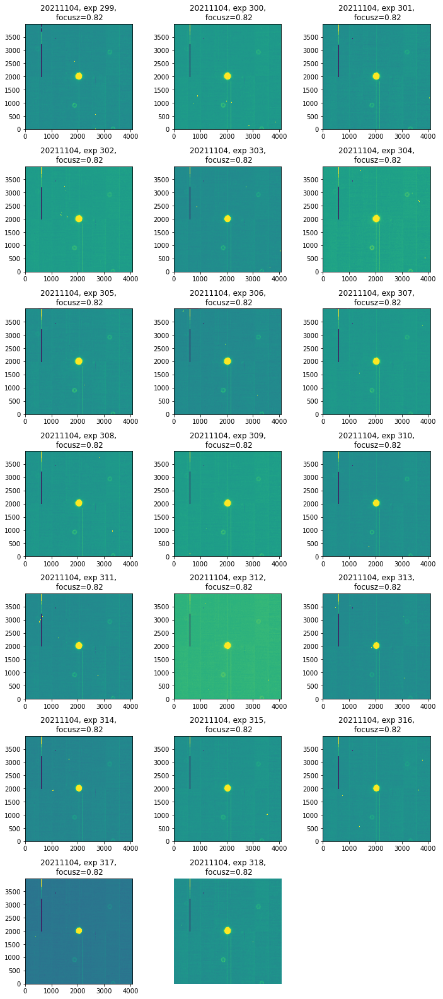

In [11]:
# show the intra-focal
preview_auxtel_exposures(year='2021', monthDay='1104', expStart=299, expEnd=318,
                            datasetRefOrType='postISRCCD', collection='u/scichris/Latiss/postISRtest')

Technical data on the `FLH0600` filter https://www.thorlabs.com/newgrouppage9.cfm?objectgroup_id=6082 

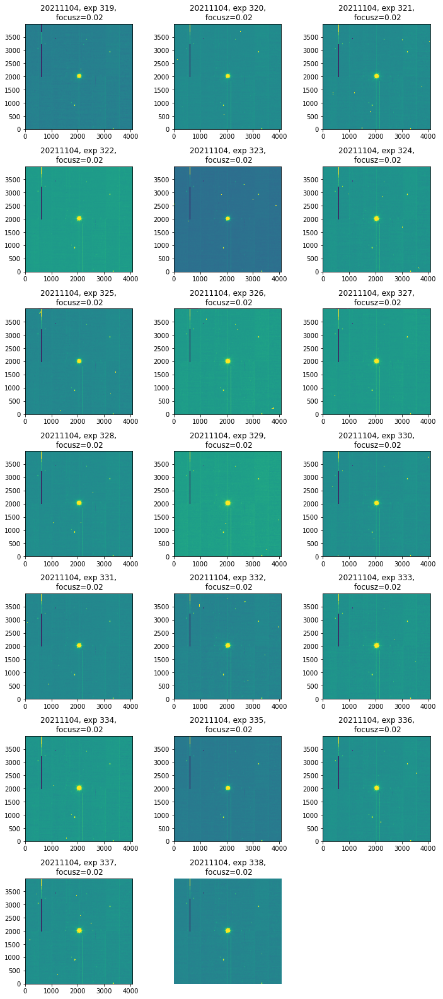

In [13]:
# show the in-focus 
preview_auxtel_exposures(year='2021', monthDay='1104', expStart=319, expEnd=338,
                            datasetRefOrType='postISRCCD', collection='u/scichris/Latiss/postISRtest')

## List the extra/ intra focal shifts 

For Latiss, the negative value is extra-focal (z-axis points down
towards M1 mirror):

    --- extra --0-- intra ----> (+z)

If both are negative, we assume that the one
more negative is extra-focal:

    --- extra ----- intra --0--> (+z)


In [1]:
import numpy as np 
from lsst.daf import butler as dafButler
# Read in the results and store in a dictionary 
expExtra = [464, 466, 468, 470, 473, 476, 479, 482, 485, 488, 491, 494]
focusz = {}

butler = dafButler.Butler('/repo/main/')
year='2021'
monthDay='0707'
datasetRefOrType='raw'
collection='LATISS/raw/all'


for exp in expExtra:

    exposure_extra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':int(f'{year}{monthDay}00{exp}')
                                        },
                      collections=[collection])
    exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                     'exposure':int(f'{year}{monthDay}00{exp+1}')
                                        },
                      collections=[collection])
    focusz[exp] = exposure_extra.getMetadata()['FOCUSZ']
    focusz[exp+1] = exposure_intra.getMetadata()['FOCUSZ']

/lsstdata/offline/instrument/LATISS/storage/2021-07-07/AT_O_20210707_000464-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-07-07/AT_O_20210707_000465-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-07-07/AT_O_20210707_000466-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-07-07/AT_O_20210707_000467-R00S00.fits: outAmp.getRawBBox() != data.getBBox(); patching. ((minimum=(0, 0), maximum=(543, 2047)) v. (minimum=(0, 0), maximum=(575, 2047)))
/lsstdata/offline/instrument/LATISS/storage/2021-07-07/AT_O_20210707_000468-R00S00.fits: outAmp.getRawBBox() != data.getBBox

In [3]:
#focusz

In [20]:
print("date      expExtra, focusz  expIntra, focusz")
for exp in expExtra:
    print(f"{year}{monthDay} {exp:>6d} {focusz[exp]:>7.3f} {exp+1:6d}  {focusz[exp+1]:>6.3f}  ")

date      expExtra, focusz  expIntra, focusz
20210707    464  -2.382    465  -0.782  
20210707    466  -2.377    467  -0.777  
20210707    468  -2.379    469  -0.779  
20210707    470  -2.390    471  -0.790  
20210707    473  -2.393    474  -0.793  
20210707    476  -2.387    477  -0.787  
20210707    479  -2.389    480  -0.789  
20210707    482  -2.396    483  -0.796  
20210707    485  -2.391    486  -0.791  
20210707    488  -2.390    489  -0.790  
20210707    491  -2.385    492  -0.785  
20210707    494  -2.390    495  -0.790  


From the above construct intra/extra pairs to pass to the ZernikeEstimate task:

In [67]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from copy import copy
from lsst.ts.wep.DonutDetector import DonutDetector
from lsst.daf import butler as dafButler

def fit_zernikes(estimateZernikeTask, expIntra=318, expExtra=339, year='2021', monthDay='1104',
                datasetRefOrType='postISRCCD', collection='u/scichris/Latiss/postISRtest',):

    butler = dafButler.Butler('/repo/main/')
    
    # load the exposure pair 
    exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{expIntra}')
                                                }, collections=[collection])

    exposure_extra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{expExtra}')
                                                }, collections=[collection])

    # declare the exposure pair
    exposure_pair = [exposure_intra, exposure_extra ]

    print(f'\nRunning Zk fitting for exposures {expIntra, expExtra}')


    # get the  template from estimateZernikeTask. 

    detectorName = exposure_extra.getDetector().getName()
    pixelScale = exposure_extra.getWcs().getPixelScale().asArcseconds()
    defocalType = DefocalType.Extra
    template = estimateZernikeTask.getTemplate(detectorName, defocalType, pixelScale)

    # detect donuts  in one of the defocal images 
    detector = DonutDetector()
    expArray = copy(exposure_extra.getImage().getArray())

    # use the adaptive threshold finding algorithm for the binary image 
    donutDf = detector.detectDonuts(expArray, template, blendRadius=200,
                                       peakThreshold=0.99, binaryChoice = 'deblend')
    
    np.save(f'donuts_{year}{monthDay}00{expIntra}_{expExtra}.npy', donutDf)

    # make a donut catalog :
    ## remove the blends in donut catalog 
    donutDfClean = donutDf[~donutDf['blended']].copy()

    ## update column names and content 
    donutCatUpd = update_donut_cat(donutDfClean.copy(), exposure_intra)

    # run zernike estimation
    zernikeOutput = estimateZernikeTask.run(exposure_pair, donutCatUpd, "LATISS")

    # store zernikes as dict
    zernikes = zernikeOutput.getDict()
    fname = f'zerDic_{year}{monthDay}00{expIntra}_{expExtra}.npy'
    np.save(fname,zernikes)
    print(f'Stored the results as {fname} ')
    
def update_donut_cat(donutCat, exposure):
    
    ## rename columns, as the EstimateZernikes  expects different names:
    ## coord_ra; coord_dec; centroid_x; centroid_y; source_flux; detector; mags
    
    
    # and add a detector column 
    donutCat['detector'] = exposure.getDetector().getName()

    # rename columns: transpose y --> x 
    donutCat = donutCat.rename(columns={"y_center":"centroid_x", "x_center":"centroid_y"})
    
    # pass whatever ra,dec to the catalog - they're not used, but are required to be there 
    wcs = exposure.getWcs()
    x = np.array(donutCat['centroid_x'].values)
    y = np.array(donutCat['centroid_y'].values)

    x = np.zeros(0)
    for row in donutCat['centroid_x'] : 
        x = np.append(x, row)

    ra,dec = wcs.pixelToSkyArray(x,y,degrees=False)  
    
    donutCat['coord_ra'] = ra
    donutCat['coord_dec'] = dec
    return donutCat

In [8]:

expIntra = np.arange(299,319)[::-1]
expExtra = np.arange(339,359)

In [9]:
expIntra

array([318, 317, 316, 315, 314, 313, 312, 311, 310, 309, 308, 307, 306,
       305, 304, 303, 302, 301, 300, 299])

In [10]:
expExtra

array([339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351,
       352, 353, 354, 355, 356, 357, 358])

In [11]:
for expI, expE in zip(expIntra,expExtra):
    print(expI,expE)

318 339
317 340
316 341
315 342
314 343
313 344
312 345
311 346
310 347
309 348
308 349
307 350
306 351
305 352
304 353
303 354
302 355
301 356
300 357
299 358


In [14]:
# initialize the zernike Task - has to be done only once 
from lsst.ts.wep.task.EstimateZernikesLatissTask import EstimateZernikesLatissTask, EstimateZernikesLatissTaskConfig
estimateZernikeConfig = EstimateZernikesLatissTaskConfig(donutStampSize=200,donutTemplateSize=200)
estimateZernikeTask = EstimateZernikesLatissTask(config=estimateZernikeConfig)
estimateZernikeTask.instName = 'auxTel'
estimateZernikeTask.opticalModel = 'onAxis'


#expExtra = np.array(expIntra)+1
for expI, expE in zip(expIntra,expExtra):
    fit_zernikes(estimateZernikeTask, expExtra=expE, expIntra=expI,
                 year='2021', monthDay='1104',)


Running Zk fitting for exposures (318, 339)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (   89.81,   99.62)

imageCoCenter: (x, y) = (  104.55,  103.41)

itr = 0, z4-z22
[ -60.  -44. -110.   19.  -51.  -49.  -48.    4.    5.   12.   49.  -24.
   14.   -9.    7.    7.   -7.   17.   10.]
itr = 1, z4-z22
[ -80.  -46. -119.   19.  -47.  -49.  -50.    4.    6.   12.   49.  -24.
   13.   -9.    8.    7.   -7.   18.    8.]
itr = 2, z4-z22
[ -94.  -47. -126.   19.  -45.  -50.  -52.    4.    6.   12.   49.  -24.
   12.   -9.    8.    7.   -8.   18.    8.]
itr = 3, z4-z22
[-109.  -61. -173.   20.  -40.  -51.  -60.    3.    5.   11.   46.  -26.
   10.  -10.   10.    7.   -8.   17.    7.]
itr = 4, z4-z22
[-120.  -71. -21

itr = 13, z4-z22
[ -42.  119. -190.   13.   15.  -75.   -0.   -0.   28.  -21.   33.   28.
   -5.   -0.    0.    9.  -48.   -9.    3.]
itr = 14, z4-z22
[ -40.  117. -188.   13.   15.  -73.    0.   -0.   28.  -21.   33.   29.
   -5.   -0.    0.    9.  -50.   -9.    3.]
Stored the results as zerDic_2021110400317_340.npy 

Running Zk fitting for exposures (316, 341)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (   99.02,   91.24)

imageCoCenter: (x, y) = (  108.69,   97.81)

itr = 0, z4-z22
[ -58.   77. -244.  -97.   30. -104.  -59.    6.   39.  -24.    3.   14.
   -5.   22.   11.   19.    3.    3.    5.]
itr = 1, z4-z22
[ -76.   77. -240.  -92.   27. -105.  -62.    6.   38.  -25.    2.   15.
   -4.   22.   11.   1

itr = 11, z4-z22
[-138.   14. -257.  -31.   52.   -8.   13.  -13.   30.  -23.   60.    7.
   -3.    2.  -12.    3.   19.  -28.    8.]
itr = 12, z4-z22
[-127.   10. -249.  -33.   50.   -6.    6.  -13.   30.  -23.   65.    7.
   -2.    2.  -13.    3.   21.  -31.    8.]
itr = 13, z4-z22
[-121.    7. -248.  -32.   49.   -5.   -0.  -13.   30.  -24.   68.    9.
   -3.    2.  -13.    4.   22.  -32.    9.]
itr = 14, z4-z22
[-113.    5. -243.  -32.   50.   -4.   -4.  -12.   30.  -24.   71.   10.
   -3.    2.  -13.    4.   24.  -33.    9.]
Stored the results as zerDic_2021110400315_342.npy 

Running Zk fitting for exposures (314, 343)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 1
imageCoCenter: (x, y) = (  104.36,   92.61)

imageCoCenter: (x, y)

itr = 3, z4-z22
[ -6. -23.   1.   1. -19.  -3. -10.   1.  -0.   3.   1.   4.   6.  -0.
   2.   0.   2.  -3.   0.]
itr = 4, z4-z22
[ -6. -33.  -2.   7. -19.  -1. -13.   1.  -0.   2.  -0.   3.   5.  -2.
   3.  -1.   1.  -1.  -0.]
itr = 5, z4-z22
[ -8. -28.  -1. -10.   6.  -3. -21.   2.  -0.   2.   2.   3.  -2.   3.
   3.   0.   2.  -2.   0.]
itr = 6, z4-z22
[ -6. -26.   1.   7. -19.  -7. -30.   1.  -0.   2.   1.   4.   6.  -2.
   3.  -0.   3.  -3.   0.]
itr = 7, z4-z22
[ -6. -23.  -1.  -2.   2.  -8. -34.   2.  -0.   2.   1.   3.  -1.   1.
   2.  -0.   1.  -2.  -0.]
itr = 8, z4-z22
[ -5. -23.   2.  -0. -16. -10. -42.   2.  -1.   2.   1.   3.   5.  -0.
   3.  -0.   1.  -2.  -0.]
itr = 9, z4-z22
[ -5. -23.  -1.   1. -18. -13. -41.   2.  -0.   2.   2.   5.   6.  -1.
   3.  -0.   3.  -4.  -0.]
itr = 10, z4-z22
[ -4. -22.  -1.   1. -19. -15. -39.   2.   0.   2.   3.   8.   6.  -1.
   2.  -0.   4.  -5.  -0.]
itr = 11, z4-z22
[ -2. -21.  -0.  -1. -20. -18. -38.   3.   0.   2.   4.  10.   6.  -0.

itr = 12, z4-z22
[ -33.    5. -340.  -67.   17.  -22.  -63.   16.   23.  -24.  -22.  -75.
    2.    1.    7.   12.  -16.  -37.   -1.]
itr = 13, z4-z22
[ -38.   -2. -324.  -64.   18.  -10.  -58.   15.   22.  -24.  -26.  -78.
    1.   -1.    7.   12.  -18.  -39.   -0.]
itr = 14, z4-z22
[ -43.   -8. -311.  -59.   17.    1.  -55.   14.   22.  -24.  -30.  -80.
    2.   -2.    7.   12.  -20.  -40.   -0.]
1 / 2
imageCoCenter: (x, y) = (   99.21,   99.75)

imageCoCenter: (x, y) = (   99.54,   99.88)

itr = 0, z4-z22
[  7.  -9.   3.  48.   5. -22. -10.  -3.  -1.   2.   1.   1.  -1. -11.
   2.   5.   1.   1.   0.]
itr = 1, z4-z22
[  5. -15.  28.  55.   5. -29.  -3.  -1.  -4.   3.   1.  -0.  -2. -13.
   2.   8.   1.  -0.   1.]
itr = 2, z4-z22
[ 11.  -3.   2.  53.   2. -25. -11.  -3.  -0.   1.   1.   1.  -1. -12.
   2.   5.   1.   1.   0.]
itr = 3, z4-z22
[ 13.   0.  14.  57.   5. -23.  -9.  -3.  -2.   1.   4.   1.  -2. -13.
   2.   5.   0.   2.   0.]
itr = 4, z4-z22
[ 19.  -9.  18.  61.   2. -25.


Running Zk fitting for exposures (307, 350)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (  102.30,   90.64)

imageCoCenter: (x, y) = (   99.30,   91.53)

itr = 0, z4-z22
[ -49.  -65. -140. -118.  -48.   33.  -26.    2.   15.   15.   53.    7.
   10.   22.    6.  -11.   -8.   11.    7.]
itr = 1, z4-z22
[ -64.  -70. -147. -110.  -50.   31.  -21.    2.   17.   16.   53.    5.
   12.   22.    6.  -11.   -9.    9.    6.]
itr = 2, z4-z22
[ -74.  -72. -151. -103.  -55.   31.  -18.    1.   18.   16.   54.    4.
   13.   21.    6.  -11.   -9.    8.    5.]
itr = 3, z4-z22
[ -80.  -85. -199. -102.  -55.   27.  -19.    1.   16.   14.   56.    6.
   13.   21.    6.  -10.  -10.    7.    4.]
itr = 4, z4-z22
[ -83. -100. -23

itr = 12, z4-z22
[-160.  -85.  -61.   48.  -27.    6.  152.    1.   13.   12.   91.  -18.
    6.   -9.   -2.    1.   16.  -16.    7.]
itr = 13, z4-z22
[-152.  -82.  -61.   48.  -28.    9.  153.    2.   14.   12.   95.  -18.
    6.   -9.   -2.    1.   17.  -17.    8.]
itr = 14, z4-z22
[-146.  -80.  -61.   48.  -28.   10.  154.    2.   14.   12.   98.  -18.
    7.   -9.   -2.    1.   17.  -17.    8.]
Stored the results as zerDic_2021110400306_351.npy 

Running Zk fitting for exposures (305, 352)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (   97.35,  100.69)

imageCoCenter: (x, y) = (  102.81,   96.48)

itr = 0, z4-z22
[-29.   4.  66.   1.  33.   9.  30.   5. -15.  -6.  12.  -9.  -9.  -5.
   1.  -4.  12.  28.   

itr = 13, z4-z22
[-42. -83.  53.  14.   4. -31.  34.  14.  19. -17. -10. -61.   1. -12.
   1.  11.   8.   7.   3.]
itr = 14, z4-z22
[-37. -85.  57.  14.   2. -27.  36.  15.  19. -17.  -9. -64.   2. -12.
   1.  11.   8.   8.   4.]
Stored the results as zerDic_2021110400304_353.npy 

Running Zk fitting for exposures (303, 354)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (  104.02,   91.97)

imageCoCenter: (x, y) = (  102.12,   99.58)

itr = 0, z4-z22
[-27.  37. -53.  -8.  32. -49.  78.  12.   2. -22. -28. -23.  -5.  -1.
 -26.   3. -22.   1.  -0.]
itr = 1, z4-z22
[-35.  39. -55.  -9.  30. -50.  78.  11.   3. -21. -27. -22.  -4.  -1.
 -26.   3. -23.   1.  -1.]
itr = 2, z4-z22
[-41.  37. -52.  -7.  32. -50.  78.  1

itr = 12, z4-z22
[ -65.  -31.  -26.  -44.   36. -160.    1.  -12.   13.  -10.   55.  -61.
   -6.    8.    4.   37.  -69.   15.    6.]
itr = 13, z4-z22
[ -59.  -31.  -28.  -44.   36. -141.    8.  -12.   14.  -10.   57.  -65.
   -6.    8.    4.   38.  -73.   16.    6.]
itr = 14, z4-z22
[ -54.  -32.  -29.  -43.   36. -125.   14.  -12.   14.  -10.   58.  -68.
   -6.    8.    4.   39.  -76.   16.    6.]
Stored the results as zerDic_2021110400302_355.npy 

Running Zk fitting for exposures (301, 356)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 1
imageCoCenter: (x, y) = (  107.00,  100.43)

imageCoCenter: (x, y) = (  100.51,   97.53)

itr = 0, z4-z22
[-35. 111.  88. -18.  48. -80.  51.  -4. -19. -22.  13.   0.  -6.  -0.
 -17.  19.  -3.   1.   

itr = 11, z4-z22
[-17.  21. -21.  17. -17. -71. -11.  -2.  -2.  -1. -13.  -8.   4.  -4.
  -1.   5.  -4.   6.   1.]
itr = 12, z4-z22
[-14.  22. -24.  20. -19. -65. -14.  -2.  -2.  -2. -15. -10.   5.  -5.
  -1.   4.  -5.   5.   1.]
itr = 13, z4-z22
[-13.  21. -26.  21. -20. -62. -16.  -2.  -2.  -2. -16. -12.   5.  -5.
  -1.   4.  -6.   6.   1.]
itr = 14, z4-z22
[-12.  20. -36.  29. -18. -58. -16.  -4.   0.  -1. -22. -13.   4.  -7.
  -1.   3.  -7.  10.   1.]
Stored the results as zerDic_2021110400300_357.npy 

Running Zk fitting for exposures (299, 358)
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 1
imageCoCenter: (x, y) = (  102.21,   97.11)

imageCoCenter: (x, y) = (   98.64,  102.36)

itr = 0, z4-z22
[-75.  11. -84.  33.  29.  10. -15. 

Illustrate the results:

In [18]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


def plot_zernike_image(expIntra=318, expExtra=339, year='2021',monthDay='1104'):

    # plot the figure ...   
    fig = plt.figure(figsize=(14, 5))

    ####################################
    ### left - plot the fit results  ###
    #################################### 

    #add_axes([xmin,ymin,dx,dy]) 
    ax1 = fig.add_axes([0,0,0.6,1])  

    #for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}00{expIntra}_{expExtra}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    for i in range(len(zkFit['outputZernikesRaw'])):
        
        ax1.plot(np.arange(4, 23),1000*zkFit['outputZernikesRaw'][i], 
                 '-d', label=f'exp {expIntra}-{expExtra}')

    ax1.set_xlabel('Zernike Number',)
    ax1.set_ylabel('Zernike Coefficient [nanometers]', )
    ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.65, 0.65])
    ax1.set_xticks(np.arange(4,23)[::2])
    ax1.grid()

    ax1.set_title(f'auxTel test data {year}{monthDay}', fontsize=18)


    ###############################################
    ### right - plot the postISR image ###
    ###############################################


    ax2 = fig.add_axes([0.6,0,0.4,1])
    butler = dafButler.Butler('/repo/main/')
    datasetRefOrType='postISRCCD'; collection='u/scichris/Latiss/postISRtest'
    exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                                 'exposure':int(f'{year}{monthDay}00{expIntra}')
                                                    }, collections=[collection])
    zscale = ZScaleInterval()
    data = exposure_intra.image.array
    vmin, vmax = zscale.get_limits(data)

    ax2.imshow(data, origin='lower', vmin=vmin, vmax=vmax)

    nrows = len(zkFit['donutStampsExtra'])
    for i in range(nrows):
        donut = zkFit['donutStampsExtra'][i]
        xy = donut.centroid_position

        # plot the cross marking that the donut was used 
        ax2.scatter(xy[0],xy[1],s=200,marker='+',c='m', lw=4)

        # plot the donut number on the plot 
        xtext,ytext = xy[0],xy[1]
        ytext -= 60
        if xtext+100 > 4096:
            xtext -= 250
        if len(str(i))>1: # move to the left label thats too long 
            #print(i, 'moving')
            xtext -=340 
        else:
            xtext -=260
        ax2.text(xtext, ytext, f'{i}', fontsize=17, c='white' )    
    ax2.yaxis.tick_right()
    ax2.set_xlabel('x [px]')
    ax2.set_ylabel('y [px]')
    ax2.yaxis.set_label_position("right")
    ax2.set_title(f'exp{expIntra}')

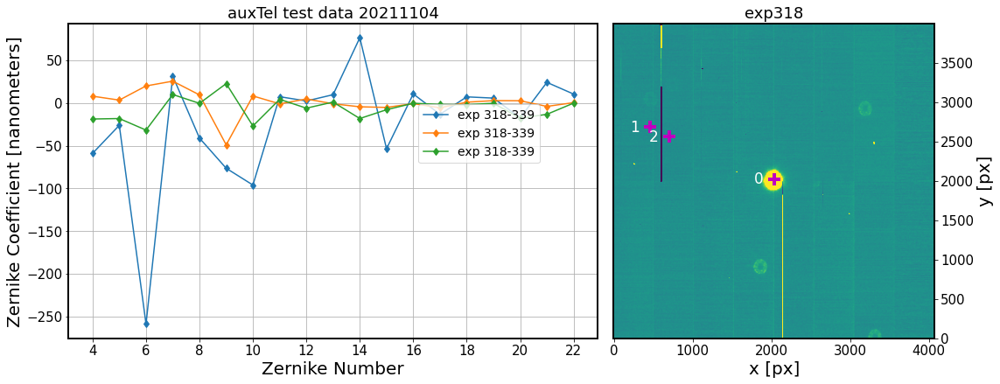

In [19]:
plot_zernike_image(expIntra=318, expExtra=339, year='2021',monthDay='1104')

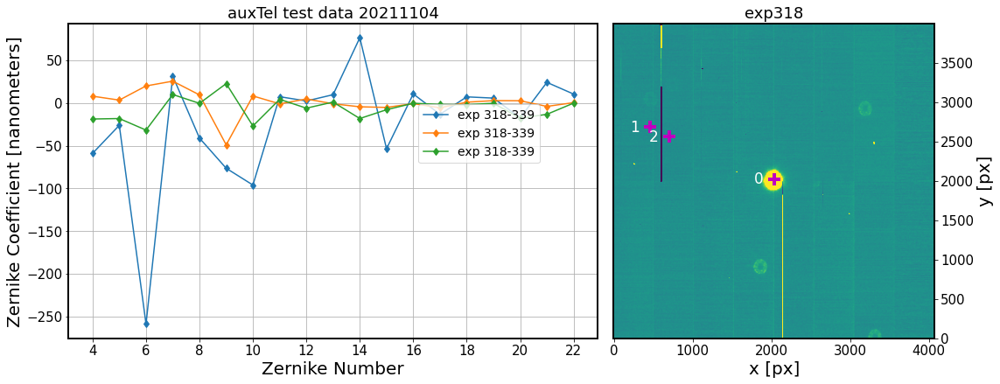

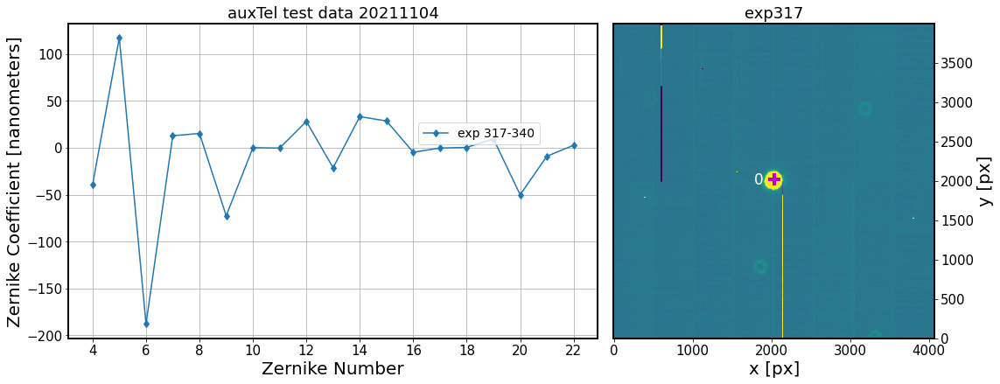

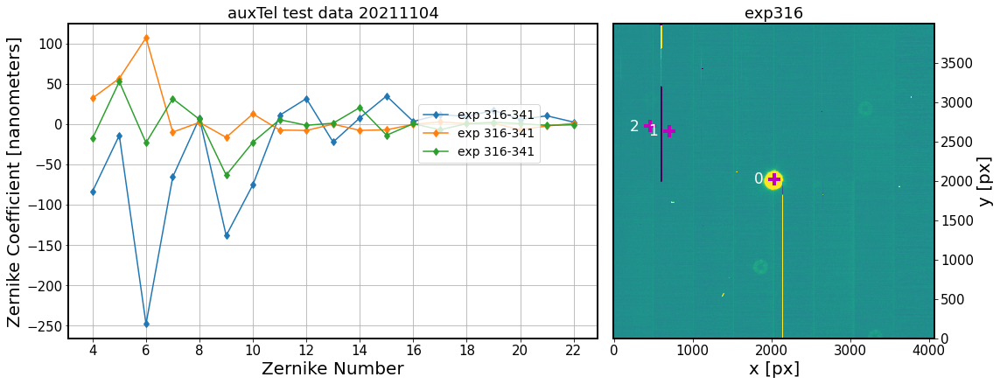

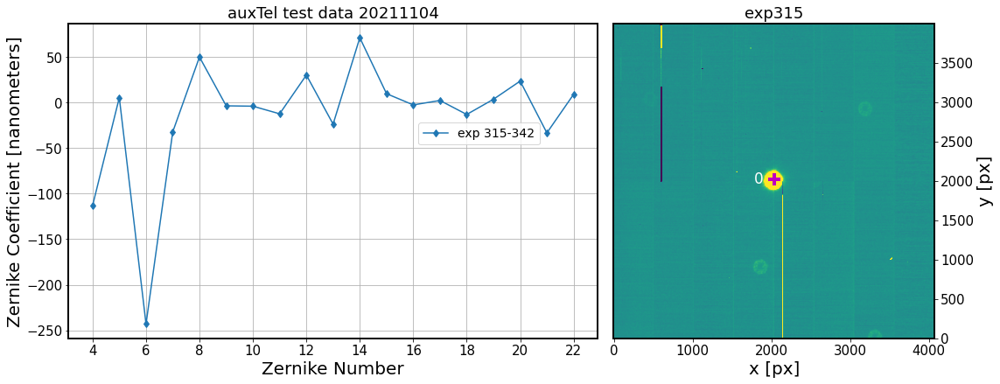

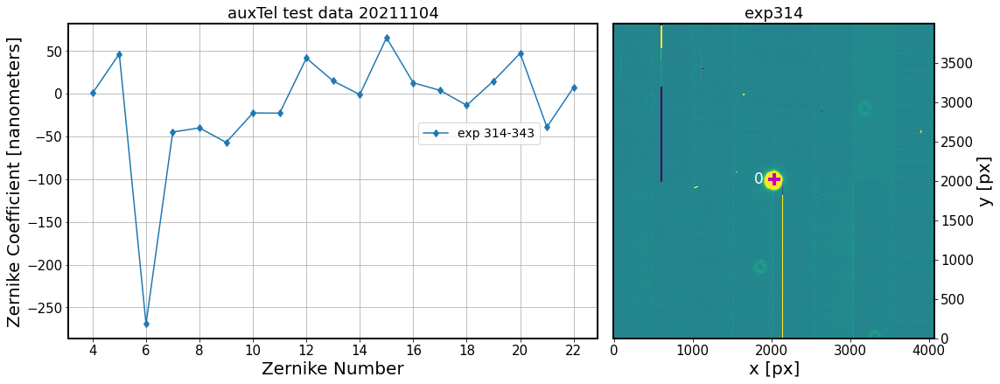

...

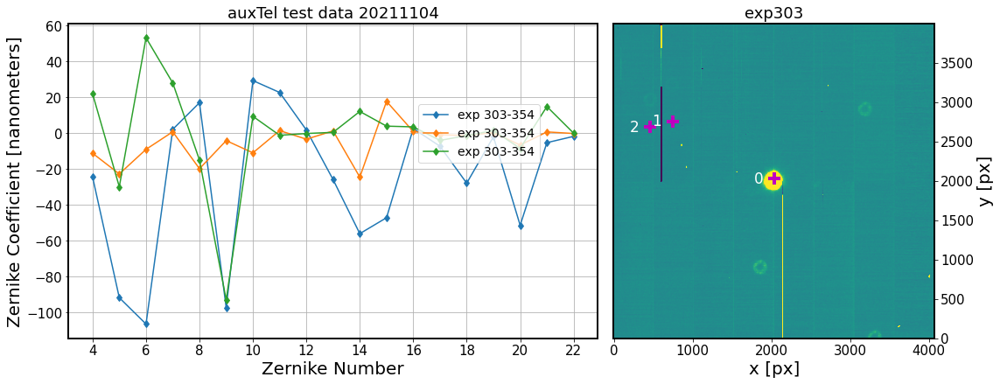

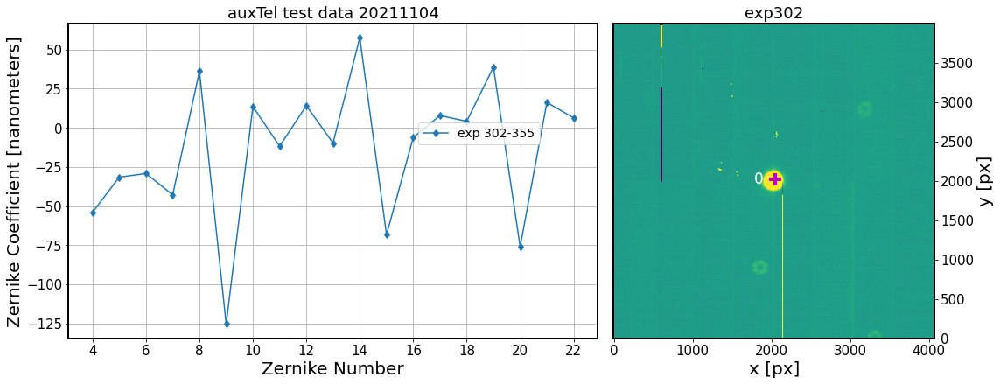

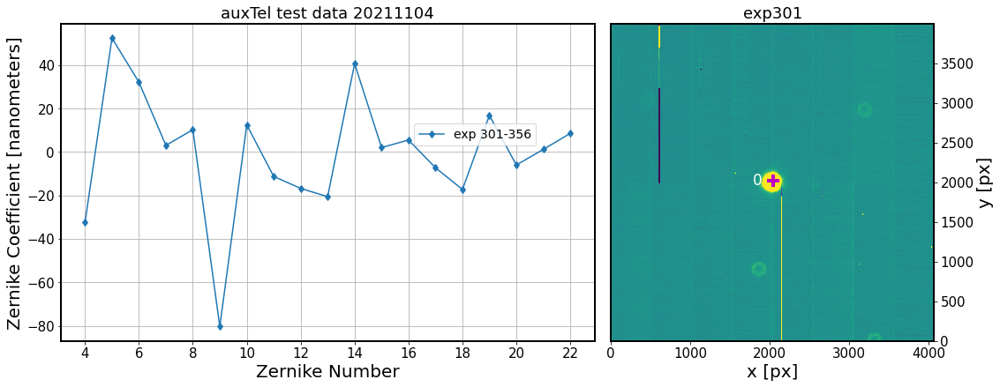

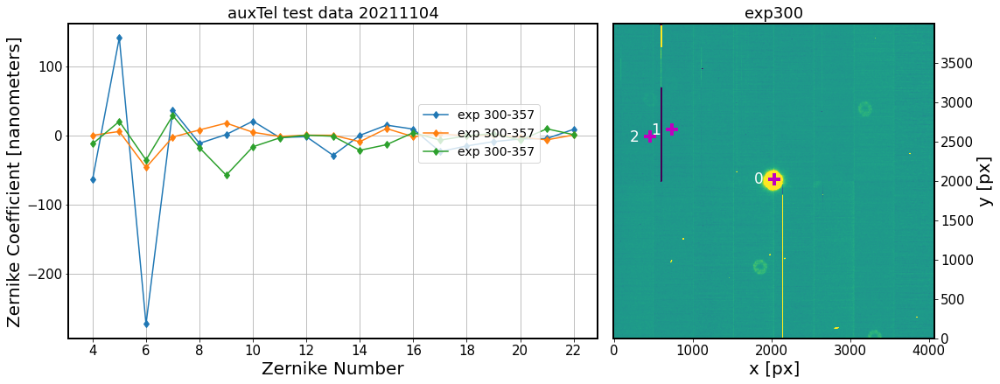

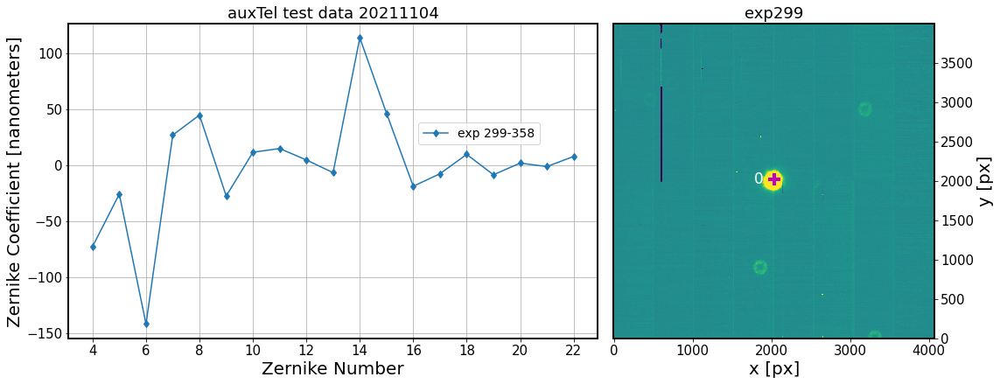

In [20]:
for expI, expE in zip(expIntra,expExtra):
    plot_zernike_image(expIntra=expI, 
                       expExtra=expE, 
                       year='2021', 
                       monthDay='1104'
                      )

In [8]:
brightDonutId = {464:0, 466:0, 468:0, 470:0, 473:0, 476:0, 479:1, 482:0, 485:0, 488:0, 491:0, 494:0 }

Plot results only for the brightest star from across different exposures:

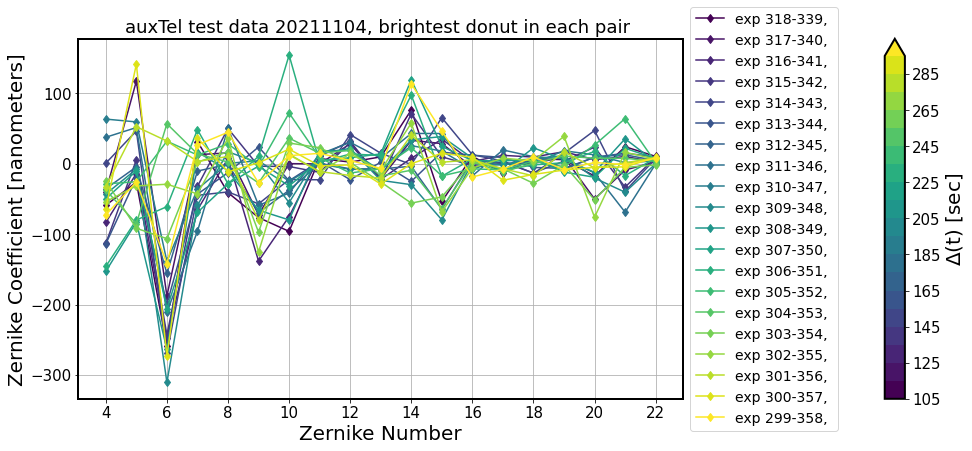

In [48]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval
import matplotlib.lines as mlines
from matplotlib import rcParams 
import matplotlib as mpl 

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


# plot the figure ...   
fig = plt.figure(figsize=(14, 5))

year='2021'
monthDay='1104'
    
####################################
### left - plot the fit results  ###
#################################### 

#add_axes([xmin,ymin,dx,dy]) 
ax1 = fig.add_axes([0,0,0.6,1])  

nlines = len(expIntra)
color_idx = np.linspace(0, 1, nlines)
ax_legend_handles = []
i = 0 
cmap = plt.cm.viridis
for expI, expE in zip(expIntra,expExtra):
    zkResultsFile = f'zerDic_{year}{monthDay}00{expI}_{expE}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    # plot zernikes only for the 0th donut. 
    # based on the above images, it is the brightest one 
    donutId = 0
    color = cmap(color_idx[i])
    ax1.plot(np.arange(4, 23),1000*zkFit['outputZernikesRaw'][donutId], '-d', color=color,
            label=f'exp {expI}-{expE}, ')
    line = mlines.Line2D([], [], color=color, ls='-', marker='o', alpha=1,
                                 )
    ax_legend_handles.append(f'exp {expI}-{expE}, ')
    i += 1 

ax1.set_xlabel('Zernike Number',)
ax1.set_ylabel('Zernike Coefficient [nanometers]', )
ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[1, 0.5],ncol=1)

ax1.set_xticks(np.arange(4,23)[::2])
ax1.grid()
ax1.set_title(f'auxTel test data {year}{monthDay}, brightest donut in each pair ', fontsize=18)

dt = 105+2*np.arange(len(expIntra))*5
bounds = dt
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='max')

#add_axes([xmin,ymin,dx,dy]) 
cax = fig.add_axes([0.8,0,0.02,1])
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=cax, orientation='vertical',
             label=r"$\Delta$(t) [sec]")

Now add the exposures: `318+317` and `339+340`,  `318+317+316`  and `339+340+341`... And test how adding the postISR images affects the Zernikes retrieved 

What do the added images look like? Is the stability of the telescope good enough to allow that ? 

In [8]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval
import matplotlib.lines as mlines
from matplotlib import rcParams 
import matplotlib as mpl 

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

expIntra=318
year='2021'
monthDay='1104'
datasetRefOrType='postISRCCD'
collection='u/scichris/Latiss/postISRtest'
butler = dafButler.Butler('/repo/main/')
   
# read in all intra consecutive exposures (299..318), show what they look like when added up 
exps = {}
for i in range(20):
    exps[i] = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{expIntra-i}')
                                                }, collections=[collection])
   

In [11]:
info = exp.getInfo()

'317'

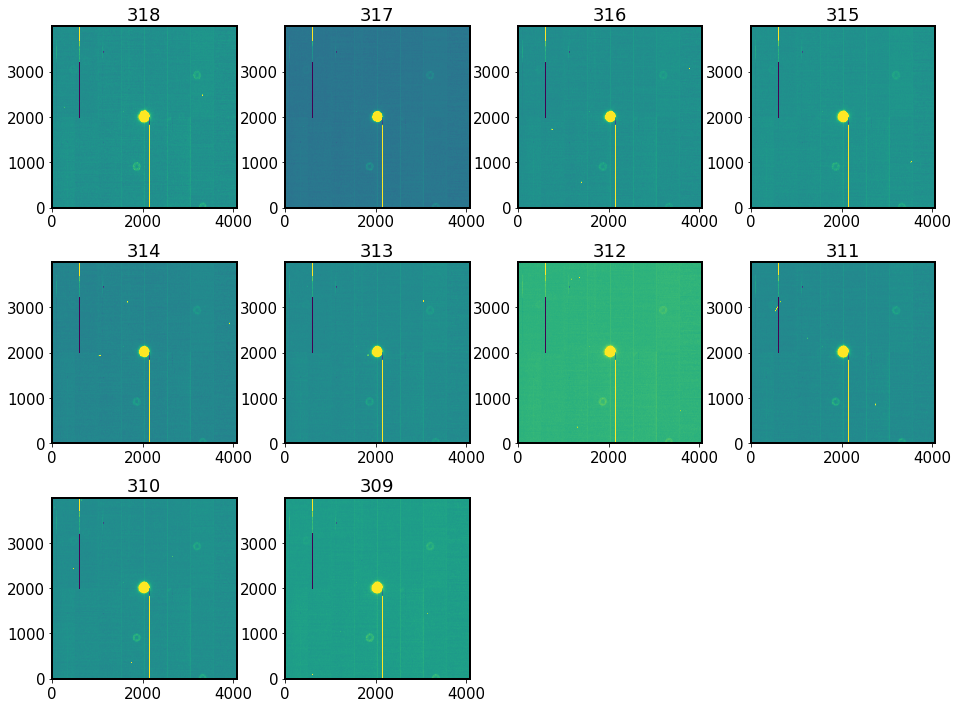

In [25]:
%matplotlib inline
zscale = ZScaleInterval()
edge = 4
nrows, ncols = 3,4
fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*edge,nrows*edge))#figsize=(10,10))
ax = np.ravel(axs)
n = len(exps)
for i in range(n):
    exp = exps[i]
    data = exp.image.array
    info = exp.getInfo()
    vmin,vmax = zscale.get_limits(data)
    ax[i].imshow(data, vmin=vmin, vmax=vmax, origin='lower')
    ax[i].set_title(str(info.getId())[-3:])
    
while i < n+1 : 
    i += 1
    ax[i].axis('off')
     
fig.subplots_adjust(hspace=0.3)

In [26]:
for i in range(len(exps)):
    info = exps[i].getInfo()
    print(info.getId())

2021110400318
2021110400317
2021110400316
2021110400315
2021110400314
2021110400313
2021110400312
2021110400311
2021110400310
2021110400309


In [41]:
for i in range(len(exps)):
    print(i,exps[i].getInfo().getId())

0 2021110400318
1 2021110400317
2 2021110400316
3 2021110400315
4 2021110400314
5 2021110400313
6 2021110400312
7 2021110400311
8 2021110400310
9 2021110400309


318
0
-16.288588 40.27789
317
1
+ 0
318
-156.39908 406.02628
316
2
+ 0
318
+ 1
317
-1010.4529 2651.9546
315
3
+ 0
318
+ 1
317
+ 2
316
-5255.133 14097.887
314
4
+ 0
318
+ 1
317
+ 2
316
+ 3
315
-23821.385 65328.047
313
5
+ 0
318
+ 1
317
+ 2
316
+ 3
315
+ 4
314
-98003.086 273999.56
312
6
+ 0
318
+ 1
317
+ 2
316
+ 3
315
+ 4
314
+ 5
313
-374755.3 1065949.2
311
7
+ 0
318
+ 1
317
+ 2
316
+ 3
315
+ 4
314
+ 5
313
+ 6
312
-1352778.8 3908180.5
310
8
+ 0
318
+ 1
317
+ 2
316
+ 3
315
+ 4
314
+ 5
313
+ 6
312
+ 7
311
-4659603.0 13654062.0
309
9
+ 0
318
+ 1
317
+ 2
316
+ 3
315
+ 4
314
+ 5
313
+ 6
312
+ 7
311
+ 8
310
-15435192.0 45823704.0


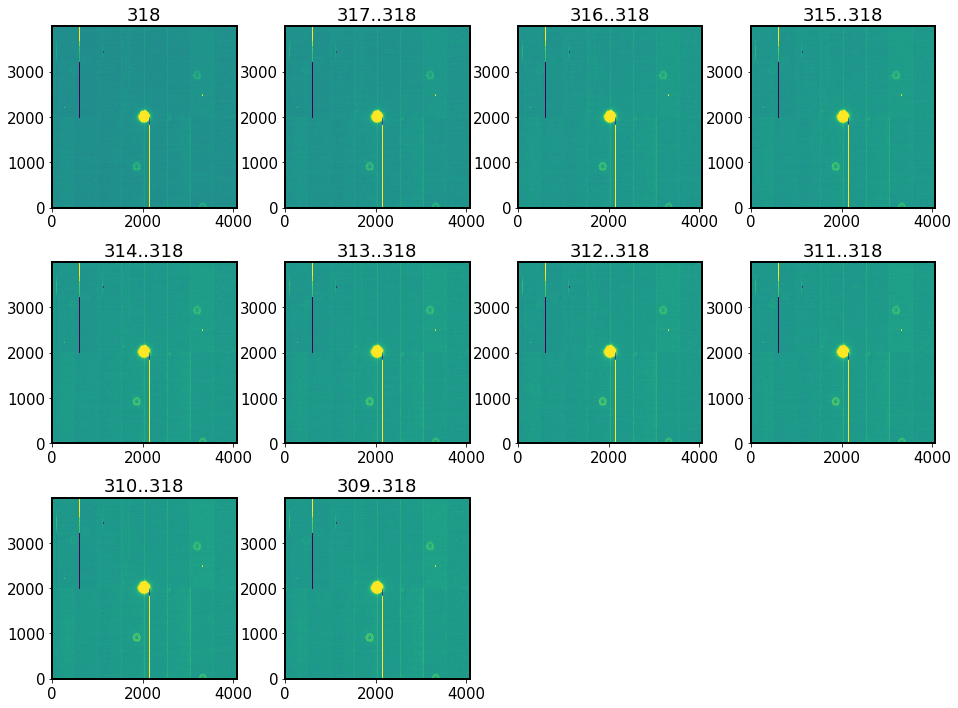

In [49]:
%matplotlib inline
zscale = ZScaleInterval()
edge = 4
nrows, ncols = 3,4
fig,axs = plt.subplots(nrows,ncols,figsize=(ncols*edge,nrows*edge))#figsize=(10,10))
ax = np.ravel(axs)
n = len(exps)

for i in range(n):
    infos = []
    info = exps[i].getInfo()
    expId = str(info.getId())[-3:]
    print(expId)
    infos.append(expId)
    
    data = exps[i].image.array
    print(i)
    for j in range(i):
        print('+',j)
        info1 = exps[j].getInfo()
        expId = str(info1.getId())[-3:]
        print(expId)
        infos.append(expId)
        data += exps[j].image.array
    
    vmin,vmax = zscale.get_limits(data)
    print(vmin,vmax)
    ax[i].imshow(data, vmin=vmin, vmax=vmax, origin='lower')
    if len(infos)<2:
        ax[i].set_title("+".join(infos))
    else:
        ax[i].set_title(f'{infos[0]}..{infos[1]}')
    
while i < n+1 : 
    i += 1
    ax[i].axis('off')
     
fig.subplots_adjust(hspace=0.3)

The vmin, vmax values show that the images do get added... Let's see if that changes anyhow the retrieved Zk values...

In [3]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval
import matplotlib.lines as mlines
from matplotlib import rcParams 
import matplotlib as mpl 

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

exps_intra = {}
exps_extra = {}


butler = dafButler.Butler('/repo/main/')
expIntra=318
expExtra=339
year='2021'
monthDay='1104'
datasetRefOrType='postISRCCD'
collection='u/scichris/Latiss/postISRtest'
    

    
for i in range(20):
    print(f'loading {i}')
    exps_intra[i] = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{expIntra-i}')
                                                }, collections=[collection])
    
    exps_extra[i] = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{expExtra+i}')
                                                }, collections=[collection])

Show that stacking images indeed worked - they have different ranges:

create added exposures:
    
    

In [4]:
infoIntra = {}
infoExtra = {}
for i in range(20):
    infos_intra, infos_extra = [],[]
    info_intra = exps_intra[i].getInfo()
    info_extra = exps_extra[i].getInfo()
    expId_intra = str(info_intra.getId())[-3:]
    expId_extra = str(info_extra.getId())[-3:]
    print(expId_intra, expId_extra)
    infos_intra.append(expId_intra)
    infos_extra.append(expId_extra)
    
    # base exposure to which we add the ones in the loop below 
    exposure_intra = exps_intra[i]
    exposure_extra = exps_extra[i]
    data_intra = exposure_intra.image.array
    data_extra = exposure_extra.image.array
    
    print(i)
    for j in range(i): # adding extra exposures 
        print('+',j)
        info_intra1 = exps_intra[j].getInfo()
        infos_intra.append(str(info_intra1.getId())[-3:])
        data_intra += exps_intra[j].image.array
        
        info_extra1 = exps_extra[j].getInfo()
        infos_extra.append(str(info_extra1.getId())[-3:])
        data_extra += exps_extra[j].image.array
    
    # substitute the data portion of arrays with added data
    exps_intra[i].image.array[:] = data_intra
    exps_extra[i].image.array[:] = data_extra 
    
    # add the information about added exposures
    infoIntra[i] = infos_intra
    infoExtra[i] = infos_extra

318 339
0
317 340
1
+ 0
316 341
2
+ 0
+ 1
315 342
3
+ 0
+ 1
+ 2
314 343
4
+ 0
+ 1
+ 2
+ 3
313 344
5
+ 0
+ 1
+ 2
+ 3
+ 4
312 345
6
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
311 346
7
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
310 347
8
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
309 348
9
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
308 349
10
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
307 350
11
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
306 351
12
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
305 352
13
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
304 353
14
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
+ 13
303 354
15
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
+ 13
+ 14
302 355
16
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
+ 13
+ 14
+ 15
301 356
17
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
+ 13
+ 14
+ 15
+ 16
300 357
18
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
+ 13
+ 14
+ 15
+ 16
+ 17
299 358
19
+ 0
+ 1
+ 2
+ 3
+ 4
+ 5
+ 6
+ 7
+ 8
+ 9
+ 10
+ 11
+ 12
+ 13
+ 14
+ 15


In [18]:
infoExtra

{0: ['339'],
 1: ['340', '339'],
 2: ['341', '339', '340'],
 3: ['342', '339', '340', '341'],
 4: ['343', '339', '340', '341', '342'],
 5: ['344', '339', '340', '341', '342', '343'],
 6: ['345', '339', '340', '341', '342', '343', '344'],
 7: ['346', '339', '340', '341', '342', '343', '344', '345'],
 8: ['347', '339', '340', '341', '342', '343', '344', '345', '346'],
 9: ['348', '339', '340', '341', '342', '343', '344', '345', '346', '347'],
 10: ['349',
  '339',
  '340',
  '341',
  '342',
  '343',
  '344',
  '345',
  '346',
  '347',
  '348'],
 11: ['350',
  '339',
  '340',
  '341',
  '342',
  '343',
  '344',
  '345',
  '346',
  '347',
  '348',
  '349'],
 12: ['351',
  '339',
  '340',
  '341',
  '342',
  '343',
  '344',
  '345',
  '346',
  '347',
  '348',
  '349',
  '350'],
 13: ['352',
  '339',
  '340',
  '341',
  '342',
  '343',
  '344',
  '345',
  '346',
  '347',
  '348',
  '349',
  '350',
  '351'],
 14: ['353',
  '339',
  '340',
  '341',
  '342',
  '343',
  '344',
  '345',
  '346',


In [17]:
infoIntra

{0: ['318'],
 1: ['317', '318'],
 2: ['316', '318', '317'],
 3: ['315', '318', '317', '316'],
 4: ['314', '318', '317', '316', '315'],
 5: ['313', '318', '317', '316', '315', '314'],
 6: ['312', '318', '317', '316', '315', '314', '313'],
 7: ['311', '318', '317', '316', '315', '314', '313', '312'],
 8: ['310', '318', '317', '316', '315', '314', '313', '312', '311'],
 9: ['309', '318', '317', '316', '315', '314', '313', '312', '311', '310'],
 10: ['308',
  '318',
  '317',
  '316',
  '315',
  '314',
  '313',
  '312',
  '311',
  '310',
  '309'],
 11: ['307',
  '318',
  '317',
  '316',
  '315',
  '314',
  '313',
  '312',
  '311',
  '310',
  '309',
  '308'],
 12: ['306',
  '318',
  '317',
  '316',
  '315',
  '314',
  '313',
  '312',
  '311',
  '310',
  '309',
  '308',
  '307'],
 13: ['305',
  '318',
  '317',
  '316',
  '315',
  '314',
  '313',
  '312',
  '311',
  '310',
  '309',
  '308',
  '307',
  '306'],
 14: ['304',
  '318',
  '317',
  '316',
  '315',
  '314',
  '313',
  '312',
  '311',


Run zernike estimation for added images:

In [20]:
# initialize the zernike Task - has to be done only once 
from lsst.ts.wep.task.EstimateZernikesLatissTask import EstimateZernikesLatissTask, EstimateZernikesLatissTaskConfig
estimateZernikeConfig = EstimateZernikesLatissTaskConfig(donutStampSize=200,donutTemplateSize=200)
estimateZernikeTask = EstimateZernikesLatissTask(config=estimateZernikeConfig)
estimateZernikeTask.instName = 'auxTel'
estimateZernikeTask.opticalModel = 'onAxis'


def update_donut_cat(donutCat, exposure):
    
    ## rename columns, as the EstimateZernikes  expects different names:
    ## coord_ra; coord_dec; centroid_x; centroid_y; source_flux; detector; mags
    
    
    # and add a detector column 
    donutCat['detector'] = exposure.getDetector().getName()

    # rename columns: transpose y --> x 
    donutCat = donutCat.rename(columns={"y_center":"centroid_x", "x_center":"centroid_y"})
    
    # pass whatever ra,dec to the catalog - they're not used, but are required to be there 
    wcs = exposure.getWcs()
    x = np.array(donutCat['centroid_x'].values)
    y = np.array(donutCat['centroid_y'].values)

    x = np.zeros(0)
    for row in donutCat['centroid_x'] : 
        x = np.append(x, row)

    ra,dec = wcs.pixelToSkyArray(x,y,degrees=False)  
    
    donutCat['coord_ra'] = ra
    donutCat['coord_dec'] = dec
    return donutCat



for i in range(20):
    exposure_pair = [exps_intra[i], exps_extra[i]]
    print(f'\nRunning Zk fitting for exposures {"+".join(infoIntra[i]),"+".join(infoExtra[i][::-1])}')
    
    exposure_extra = exps_extra[i]
    
    # get the  template from estimateZernikeTask
    detectorName = exposure_extra.getDetector().getName()
    pixelScale = exposure_extra.getWcs().getPixelScale().asArcseconds()
    defocalType = DefocalType.Extra
    template = estimateZernikeTask.getTemplate(detectorName, defocalType, pixelScale)

    # detect donuts  in one of the defocal images 
    detector = DonutDetector()
    expArray = copy(exposure_extra.getImage().getArray())

    # use the adaptive threshold finding algorithm for the binary image 
    donutDf = detector.detectDonuts(expArray, template, blendRadius=200,
                                       peakThreshold=0.99, binaryChoice = 'deblend')
    np.save(f'donuts_{year}{monthDay}_comb_{i}.npy', donutDf)
    
    # make a donut catalog :
    ## remove the blends in donut catalog 
    donutDfClean = donutDf[~donutDf['blended']].copy()

    ## update column names and content 
    donutCatUpd = update_donut_cat(donutDfClean.copy(), exposure_intra)

    # run zernike estimation
    zernikeOutput = estimateZernikeTask.run(exposure_pair, donutCatUpd, "LATISS")

    # store zernikes as dict
    zernikes = zernikeOutput.getDict()
    fname = f'zerDic_{year}{monthDay}_comb_{i}.npy'
    np.save(fname,zernikes)
    print(f'Stored the results as {fname} ')


Running Zk fitting for exposures ('318', '339')
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (   89.81,   99.62)

imageCoCenter: (x, y) = (  104.55,  103.41)

itr = 0, z4-z22
[ -60.  -44. -110.   19.  -51.  -49.  -48.    4.    5.   12.   49.  -24.
   14.   -9.    7.    7.   -7.   17.   10.]
itr = 1, z4-z22
[ -80.  -46. -119.   19.  -47.  -49.  -50.    4.    6.   12.   49.  -24.
   13.   -9.    8.    7.   -7.   18.    8.]
itr = 2, z4-z22
[ -94.  -47. -126.   19.  -45.  -50.  -52.    4.    6.   12.   49.  -24.
   12.   -9.    8.    7.   -8.   18.    8.]
itr = 3, z4-z22
[-109.  -61. -173.   20.  -40.  -51.  -60.    3.    5.   11.   46.  -26.
   10.  -10.   10.    7.   -8.   17.    7.]
itr = 4, z4-z22
[-120.  -71.

itr = 0, z4-z22
[ -46.   42. -159.   19.  -11.  -49.  -30.    1.   18.   -6.   31.   -4.
    3.   -6.    4.    9.  -16.    7.    7.]
itr = 1, z4-z22
[ -60.   43. -164.   18.  -12.  -50.  -31.    1.   19.   -6.   32.   -4.
    4.   -6.    4.    9.  -17.    7.    6.]
itr = 2, z4-z22
[ -71.   44. -167.   18.  -14.  -51.  -32.    1.   19.   -6.   33.   -4.
    3.   -6.    5.    9.  -17.    7.    5.]
itr = 3, z4-z22
[ -80.   59. -219.   19.  -13.  -52.  -34.    1.   17.   -6.   32.   -4.
    3.   -6.    5.    9.  -17.    7.    5.]
itr = 4, z4-z22
[ -87.   71. -256.   19.  -12.  -53.  -36.    0.   16.   -6.   31.   -4.
    3.   -6.    5.    9.  -17.    7.    5.]
itr = 5, z4-z22
[ -91.   64. -247.    9.   -5.  -68.  -49.    1.   15.   -6.   31.   -4.
    0.   -2.    5.    8.  -17.    6.    4.]
itr = 6, z4-z22
[ -94.   59. -245.   11.   -6.  -79.  -57.    1.   15.   -6.   31.   -5.
    1.   -3.    5.    8.  -17.    5.    4.]
itr = 7, z4-z22
[ -97.   56. -244.   11.   -6.  -86.  -64.    1.   14

itr = 3, z4-z22
[ -96.   42. -240.   -8.   -4.  -67.  -50.    3.   18.   -7.   28.   -1.
    2.    0.    7.   12.  -10.   10.    5.]
itr = 4, z4-z22
[-104.   50. -283.   -7.   -3.  -67.  -53.    3.   17.   -7.   28.   -1.
    2.    0.    8.   11.  -10.   10.    5.]
itr = 5, z4-z22
[-108.   43. -272.   -2.    0.  -89.  -70.    4.   15.   -7.   28.   -2.
    0.   -1.    7.   10.  -11.    9.    4.]
itr = 6, z4-z22
[-111.   36. -271.   -4.   -1. -105.  -82.    4.   15.   -7.   28.   -3.
    1.   -1.    6.   10.  -11.    9.    4.]
itr = 7, z4-z22
[-113.   31. -272.   -3.   -1. -116.  -91.    5.   15.   -7.   28.   -3.
    1.   -1.    6.    9.  -11.    8.    4.]
itr = 8, z4-z22
[-114.   27. -273.   -4.   -1. -124.  -98.    5.   15.   -7.   28.   -4.
    1.   -1.    6.    9.  -12.    8.    4.]
itr = 9, z4-z22
[-103.   25. -269.   -1.   -4. -115.  -90.    5.   15.   -7.   37.   -5.
    1.   -2.    6.    9.  -15.   11.    4.]
itr = 10, z4-z22
[ -94.   23. -266.    0.   -5. -107.  -84.    5.   1

itr = 1, z4-z22
[11. -6. 19. -3. -5.  3.  2. -1. -3.  1. -2.  2.  1.  1.  0. -0. -2. -1.
 -1.]
itr = 2, z4-z22
[13. -7. 18. -3. -5.  2.  1. -1. -3.  1.  0.  2.  1.  1.  0. -0. -0. -0.
 -0.]
itr = 3, z4-z22
[ 16. -12.  29.  -3.  -6.   2.   1.  -1.  -3.   1.   0.   2.   1.   1.
   0.  -0.  -0.  -0.  -0.]
itr = 4, z4-z22
[ 19. -17.  40.  -3.  -8.   3.   1.  -1.  -3.   1.  -0.   2.   1.   1.
   0.  -0.  -1.  -0.  -0.]
itr = 5, z4-z22
[ 22. -14.  38.  -2.   5.   4.   5.  -1.  -3.   1.  -2.   2.  -3.   0.
  -0.  -0.  -2.  -1.  -1.]
itr = 6, z4-z22
[ 22. -12.  34.  -0.  -6.   4.   7.  -1.  -3.   1.  -0.   2.   1.  -0.
  -0.  -0.  -2.  -0.  -0.]
itr = 7, z4-z22
[ 24. -13.  33.  -3.   2.   5.   8.  -1.  -3.   1.  -0.   2.  -2.   1.
  -0.  -0.  -1.  -1.  -0.]
itr = 8, z4-z22
[25. -9. 32. -1. -4.  6. 10. -2. -3.  1. -0.  2.  0. -0. -0. -0. -1. -1.
 -0.]
itr = 9, z4-z22
[23. -8. 31. -0. -2.  6. 11. -2. -3.  1. -0.  3. -0. -0. -0. -0. -3. -1.
 -0.]
itr = 10, z4-z22
[22. -9. 28. -2. -0.  7. 12. -1. 

itr = 5, z4-z22
[  8.  -3. -10.  -0.  -0. -31.  -6.  -1.   1.   0.  -2.  -1.   1.   4.
   1.   3.   2.   0.  -0.]
itr = 6, z4-z22
[  6.  -3.  -5.  24.   6. -45.  -9.  -0.  -0.   1.  -1.  -2.  -1.  -5.
   1.   4.  -0.  -2.  -0.]
itr = 7, z4-z22
[  7.   1.  -7.  12.   3. -60. -12.  -0.  -0.   1.  -1.  -2.  -0.  -1.
   1.   4.   0.  -2.  -0.]
itr = 8, z4-z22
[  7.   4. -12.  21.   5. -73. -14.   0.   0.   1.  -1.  -2.  -1.  -4.
   1.   4.   0.  -2.  -0.]
itr = 9, z4-z22
[  9.   8. -23.  29.   7. -69. -14.  -1.   3.  -0.  -3.  -2.  -2.  -5.
   1.   3.   1.  -1.  -0.]
itr = 10, z4-z22
[  5.   7.  -9.  25.   8. -75. -14.   0.  -1.   1.  -3.  -4.  -2.  -5.
   1.   4.   1.  -4.  -0.]
itr = 11, z4-z22
[  4.  11. -13.  28.   7. -75. -14.   0.  -0.   1.  -3.  -5.  -1.  -6.
   1.   4.   2.  -5.  -0.]
itr = 12, z4-z22
[  1.  13. -17.  31.   8. -74. -14.   1.   0.   1.  -4.  -6.  -2.  -7.
   1.   4.   2.  -6.  -0.]
itr = 13, z4-z22
[ -1.  13. -13.  32.   8. -74. -12.   1.  -0.   1.  -3.  -7.  -2.  -

itr = 7, z4-z22
[-114.   29. -268.   -0.   -1.  -92.  -72.    1.   14.   -5.   29.   -5.
    1.   -2.    4.    7.  -10.    6.    5.]
itr = 8, z4-z22
[-116.   25. -270.   -0.   -1.  -98.  -78.    1.   14.   -5.   29.   -5.
    1.   -2.    4.    7.  -10.    6.    4.]
itr = 9, z4-z22
[-104.   23. -266.    4.   -4.  -91.  -74.    1.   14.   -5.   39.   -7.
    2.   -4.    4.    7.  -13.    8.    5.]
itr = 10, z4-z22
[ -94.   22. -265.    6.   -7.  -85.  -71.    1.   14.   -5.   45.   -7.
    2.   -5.    3.    7.  -15.   10.    6.]
itr = 11, z4-z22
[ -85.   21. -260.    7.   -7.  -80.  -68.    2.   14.   -5.   50.   -7.
    2.   -5.    3.    7.  -17.   12.    6.]
itr = 12, z4-z22
[ -76.   21. -256.    7.   -8.  -76.  -66.    2.   14.   -5.   54.   -8.
    3.   -4.    3.    7.  -19.   12.    7.]
itr = 13, z4-z22
[ -68.   22. -252.    5.   -8.  -74.  -64.    2.   14.   -5.   57.   -8.
    3.   -4.    3.    8.  -20.   13.    7.]
itr = 14, z4-z22
[ -61.   22. -247.    5.   -9.  -71.  -62.    2.

itr = 6, z4-z22
[ 22. -13.  36.  -2.   3.   7.   2.  -2.  -3.   1.  -1.   2.  -2.   0.
   0.  -0.  -2.  -1.  -0.]
itr = 7, z4-z22
[ 20. -17.  30.  -0.  -9.  10.   1.  -2.  -2.   1.  -1.   2.   2.  -0.
   0.  -0.  -1.   1.  -0.]
itr = 8, z4-z22
[ 21. -18.  32.  -3.   4.  10.   1.  -2.  -2.   1.  -0.   2.  -2.   0.
  -0.  -1.  -0.  -0.  -0.]
itr = 9, z4-z22
[ 20. -20.  31.  -2.   1.   9.   1.  -2.  -2.   1.  -0.   4.  -1.   0.
   0.  -1.  -1.  -0.   0.]
itr = 10, z4-z22
[ 20. -21.  31.  -1.   0.   8.   2.  -2.  -2.   1.  -0.   6.  -1.   0.
   0.  -1.  -1.  -1.   0.]
itr = 11, z4-z22
[ 20. -19.  32.  -1.   1.   7.   3.  -2.  -2.   1.   0.   7.  -1.  -0.
   0.  -0.  -2.  -1.  -0.]
itr = 12, z4-z22
[ 19. -19.  32.  -1.   0.   7.   4.  -2.  -2.   1.   0.   9.  -1.  -0.
   0.  -0.  -2.  -1.   0.]
itr = 13, z4-z22
[ 19. -19.  33.  -0.  -2.   7.   5.  -3.  -2.   1.   0.   9.  -0.  -0.
   0.  -0.  -3.  -1.  -0.]
itr = 14, z4-z22
[ 18. -19.  32.  -0.  -2.   7.   5.  -3.  -2.   1.   0.  10.  -1.  

itr = 9, z4-z22
[  2. -16.   4.  24.  -3. -61.  -4.   2.  -4.   1.  -1.  -1.  -0.  -3.
  -0.   3.   1.   0.  -1.]
itr = 10, z4-z22
[  1. -14.  -2.  26.  -3. -61.  -5.   2.  -4.   1.  -1.  -2.  -0.  -4.
  -0.   3.   2.  -0.  -1.]
itr = 11, z4-z22
[ -0. -15.  -7.  28.  -4. -62.  -5.   3.  -4.   1.  -0.  -2.   0.  -5.
  -0.   3.   2.  -0.  -1.]
itr = 12, z4-z22
[ -2. -12. -12.  27.  -3. -63.  -7.   3.  -4.   1.  -1.  -2.  -0.  -5.
  -0.   3.   2.  -0.  -1.]
itr = 13, z4-z22
[ -3. -13. -17.  29.  -4. -64.  -7.   3.  -4.   1.  -0.  -3.   0.  -5.
  -0.   3.   2.  -0.  -1.]
itr = 14, z4-z22
[ -4. -10. -25.  28.  -4. -66. -10.   3.  -3.   1.  -1.  -3.  -0.  -5.
  -0.   3.   2.  -0.  -1.]
2 / 3
imageCoCenter: (x, y) = (   97.45,  102.17)

imageCoCenter: (x, y) = (  101.36,  100.99)

itr = 0, z4-z22
[ -53.   26. -167.   -6.   -6.  -52.  -34.    2.   18.   -5.   30.   -3.
    3.   -0.    4.    9.   -9.    8.    7.]
itr = 1, z4-z22
[ -70.   23. -171.   -4.   -5.  -51.  -35.    1.   18.   -5.   30.

itr = 10, z4-z22
[ -93.   21. -264.    6.   -7.  -85.  -71.    1.   14.   -5.   45.   -6.
    2.   -5.    3.    7.  -16.   10.    6.]
itr = 11, z4-z22
[ -84.   21. -260.    6.   -7.  -80.  -69.    2.   14.   -5.   50.   -7.
    3.   -4.    3.    7.  -18.   11.    6.]
itr = 12, z4-z22
[ -75.   21. -256.    5.   -8.  -76.  -66.    2.   14.   -5.   54.   -7.
    3.   -4.    3.    8.  -19.   12.    7.]
itr = 13, z4-z22
[ -68.   22. -251.    4.   -8.  -73.  -64.    2.   14.   -5.   57.   -7.
    3.   -4.    3.    8.  -20.   13.    7.]
itr = 14, z4-z22
[ -60.   22. -247.    4.   -9.  -71.  -62.    2.   14.   -5.   59.   -7.
    4.   -4.    3.    8.  -21.   13.    7.]
Stored the results as zerDic_20211104_comb_10.npy 

Running Zk fitting for exposures ('307+318+317+316+315+314+313+312+311+310+309+308', '349+348+347+346+345+344+343+342+341+340+339+350')
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In Do

itr = 10, z4-z22
[ 23. -24.  23.  -2.   1.  -2.   4.  -2.  -2.   1.  -0.   4.  -1.  -0.
   0.   0.  -3.   1.  -0.]
itr = 11, z4-z22
[ 22. -26.  22.  -2.   4.  -2.   5.  -2.  -1.   1.  -0.   6.  -2.   0.
   0.   0.  -3.   1.  -0.]
itr = 12, z4-z22
[ 20. -30.  19.  -1.  -1.  -1.   4.  -2.  -1.   1.  -1.   7.  -0.  -0.
   0.   0.  -4.   2.   0.]
itr = 13, z4-z22
[ 20. -34.  18.  -2.  -0.   1.   4.  -2.  -2.   1.  -2.   8.  -0.  -0.
   0.   0.  -5.   2.   0.]
itr = 14, z4-z22
[ 21. -30.  22.  -0.   3.   0.   6.  -3.  -2.   0.  -2.   9.  -2.  -0.
   0.   0.  -6.   2.   0.]
1 / 3
imageCoCenter: (x, y) = (   99.48,   99.88)

imageCoCenter: (x, y) = (  101.49,  107.12)

itr = 0, z4-z22
[  5. -10.   5.  45.  -6. -21.   0.  -1.  -2.   2.  -2.  -3.   1. -11.
  -0.   4.   1.  -2.  -0.]
itr = 1, z4-z22
[  9.  -9.   8.  46.  -6. -21.   1.  -1.  -3.   2.  -1.  -2.   1. -11.
  -0.   3.   1.  -2.  -1.]
itr = 2, z4-z22
[ 13. -10.   8.  46.  -5. -21.   0.  -1.  -3.   2.  -1.  -2.   1. -11.
  -0.   4.   1

itr = 13, z4-z22
[  7.   3. -47.  33.  -9. -55.  -2.  -3.   2.   1.  -3.  -3.   3.  -8.
   0.   3.   5. -11.   0.]
itr = 14, z4-z22
[  8.   3. -46.  32.  -9. -53.  -2.  -3.   2.   1.  -5.  -4.   3.  -8.
   0.   3.   6. -12.   1.]
2 / 3
imageCoCenter: (x, y) = (   97.46,  102.19)

imageCoCenter: (x, y) = (  101.36,  101.00)

itr = 0, z4-z22
[ -53.   25. -167.   -6.   -6.  -52.  -34.    2.   18.   -5.   30.   -3.
    3.   -0.    4.    9.   -9.    8.    7.]
itr = 1, z4-z22
[ -70.   23. -171.   -4.   -5.  -51.  -35.    1.   18.   -5.   30.   -3.
    2.   -2.    4.    9.   -9.    8.    6.]
itr = 2, z4-z22
[ -83.   26. -177.   -8.   -6.  -55.  -36.    1.   19.   -5.   31.   -3.
    3.   -0.    5.    9.   -9.    8.    6.]
itr = 3, z4-z22
[ -93.   35. -234.   -7.   -5.  -54.  -40.    1.   17.   -5.   30.   -3.
    2.   -0.    5.    9.   -9.    8.    5.]
itr = 4, z4-z22
[-101.   41. -276.   -5.   -4.  -54.  -42.    1.   16.   -5.   29.   -3.
    2.   -0.    5.    9.  -10.    8.    5.]
itr = 5, 

itr = 13, z4-z22
[ -68.   21. -251.    5.   -8.  -73.  -64.    2.   14.   -5.   57.   -7.
    3.   -4.    3.    8.  -20.   13.    7.]
itr = 14, z4-z22
[ -60.   22. -247.    5.   -9.  -71.  -62.    2.   14.   -5.   59.   -7.
    4.   -4.    3.    8.  -20.   13.    7.]
Stored the results as zerDic_20211104_comb_14.npy 

Running Zk fitting for exposures ('303+318+317+316+315+314+313+312+311+310+309+308+307+306+305+304', '353+352+351+350+349+348+347+346+345+344+343+342+341+340+339+354')
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
Using deblendAdapt _getImgBinaryAdapt to get image binary
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (   99.34,   99.39)

imageCoCenter: (x, y) = (   99.58,  101.33)

itr = 0, z4-z22
[  0.  -3.   9.   4. -13.  -5.  -3.  -0.  -1.   0.  -2.   2.   2.  -1.
   1.   2.  -2.  -2.  -0.]
itr = 1

itr = 12, z4-z22
[ 3. 13. 49.  0.  4. -8.  5. -1. -2.  0. -5.  1. -1. -1. -1.  1. -1.  2.
  0.]
itr = 13, z4-z22
[ 2. 16. 51.  1.  5. -9.  5. -1. -2. -0. -6.  2. -1. -2. -1.  1. -1.  2.
  0.]
itr = 14, z4-z22
[ 1. 19. 53.  1.  5. -9.  5. -1. -2. -0. -6.  2. -1. -2. -1.  1. -0.  2.
  0.]
1 / 3
imageCoCenter: (x, y) = (   99.59,   99.56)

imageCoCenter: (x, y) = (   97.13,  108.45)

itr = 0, z4-z22
[  0.  -6. -11.  43. -11. -18.   1.  -0.   1.   1.  -0.   0.   3. -12.
   0.   4.   0.  -3.  -0.]
itr = 1, z4-z22
[  1.  -5. -14.  44. -11. -18.   1.  -0.   1.   1.  -0.   0.   3. -12.
   0.   4.   0.  -3.  -0.]
itr = 2, z4-z22
[  1.  -6. -12.  44. -10. -18.   1.  -0.   1.   1.  -0.   0.   3. -12.
   0.   4.   0.  -3.  -0.]
itr = 3, z4-z22
[  1. -10. -21.  44. -10. -18.   0.  -0.   1.   1.  -0.   0.   3. -12.
   0.   4.   0.  -3.  -0.]
itr = 4, z4-z22
[  2. -15. -27.  44. -10. -18.  -0.  -0.   1.   1.   0.   0.   3. -12.
   0.   4.  -0.  -3.  -0.]
itr = 5, z4-z22
[  0. -16. -29.   3.  -0. -31.

itr = 1, z4-z22
[ -70.   23. -171.   -4.   -5.  -51.  -35.    1.   18.   -5.   30.   -3.
    2.   -2.    4.    9.   -9.    8.    6.]
itr = 2, z4-z22
[ -83.   26. -177.   -8.   -6.  -55.  -36.    1.   19.   -5.   31.   -3.
    3.   -0.    5.    9.   -9.    8.    6.]
itr = 3, z4-z22
[ -93.   35. -234.   -7.   -5.  -54.  -40.    1.   17.   -5.   30.   -3.
    2.   -0.    5.    9.   -9.    8.    5.]
itr = 4, z4-z22
[-101.   42. -276.   -5.   -4.  -54.  -42.    1.   16.   -5.   29.   -3.
    2.   -0.    5.    9.  -10.    8.    5.]
itr = 5, z4-z22
[-106.   36. -270.   -2.   -2.  -71.  -56.    1.   15.   -5.   29.   -3.
    1.   -2.    5.    8.  -10.    7.    5.]
itr = 6, z4-z22
[-110.   32. -265.    0.    0.  -84.  -65.    1.   14.   -5.   30.   -4.
    1.   -3.    4.    8.  -10.    6.    5.]
itr = 7, z4-z22
[-113.   28. -267.   -1.   -1.  -92.  -72.    1.   14.   -5.   29.   -5.
    1.   -2.    4.    7.  -10.    6.    4.]
itr = 8, z4-z22
[-115.   25. -270.   -0.   -1.  -98.  -78.    1.   14

In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
In DonutTemplateModel using opticalModel onAxis
and maskScalingFactorLocal=2.0
0 / 3
imageCoCenter: (x, y) = (   99.53,   99.48)

imageCoCenter: (x, y) = (   99.55,   99.54)

itr = 0, z4-z22
[  2.  -0. -16.  -6.  -2.   5.   4.  -1.   3.   0.   2.   3.  -0.   1.
  -1.  -1.  -2.   0.   0.]
itr = 1, z4-z22
[  3.  -0. -16.  -6.  -2.   5.   4.  -1.   3.   0.   2.   3.  -0.   1.
  -1.  -1.  -2.   0.   0.]
itr = 2, z4-z22
[  4.  -0. -16.  -5.  -1.   5.   4.  -1.   3.   0.   2.   3.  -0.   1.
  -1.  -1.  -2.   0.   0.]
itr = 3, z4-z22
[  4.   1. -25.  -3.  -5.   3.   3.  -0.   4.  -0.   2.   2.   1.   0.
  -1.  -1.  -2.   0.   0.]
itr = 4, z4-z22
[  4.   2. -36.  -3.  -5.   4.   4.  -0.   4.  -0.   1.   2.   1.   0.
  -1.  -1.  -2.   0.   0.]
itr = 5, z4-z22
[  5.   0. -28.  -2.   4.   7.   6.  -1.   3.   0.   2.   3.  -2.   0.
  -1.  -1.  -2.   0.   0.]
itr = 6, z4-z22
[  5.   2. -25.  -0.  -5.   9.   7.  -1.   3. 

Check if the results make any sense... 

In [9]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval
import matplotlib.lines as mlines
from matplotlib import rcParams 
import matplotlib as mpl 

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18

def plot_zernike_image_comb(exposure_intra, k=0, year='2021',monthDay='1104',
                            datasetRefOrType='postISRCCD',
                            collection='u/scichris/Latiss/postISRtest', 
    ):

    # plot the figure ...   
    fig = plt.figure(figsize=(14, 5))

    ####################################
    ### left - plot the fit results  ###
    #################################### 

    #add_axes([xmin,ymin,dx,dy]) 
    ax1 = fig.add_axes([0,0,0.6,1])  

    #for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}_comb_{k}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    for i in range(len(zkFit['outputZernikesRaw'])):
    #donut = 0  
        ax1.plot(np.arange(4, 23),1000*zkFit['outputZernikesRaw'][i], 
                 '-d', )

    ax1.set_xlabel('Zernike Number',)
    ax1.set_ylabel('Zernike Coefficient [nanometers]', )
    ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.65, 0.65])
    ax1.set_xticks(np.arange(4,23)[::2])
    ax1.grid()

    ax1.set_title(f'auxTel test data {year}{monthDay}, {k}', fontsize=18)


    ###############################################
    ### right - plot the postISR image ###
    ###############################################


    ax2 = fig.add_axes([0.6,0,0.4,1])
    zscale = ZScaleInterval()
    data = exposure_intra.image.array
    vmin, vmax = zscale.get_limits(data)

    ax2.imshow(data, origin='lower', vmin=vmin, vmax=vmax)

    nrows = len(zkFit['donutStampsExtra'])
    for i in range(nrows):
        donut = zkFit['donutStampsExtra'][i]
        xy = donut.centroid_position

        # plot the cross marking that the donut was used 
        ax2.scatter(xy[0],xy[1],s=200,marker='+',c='m', lw=4)

        # plot the donut number on the plot 
        xtext,ytext = xy[0],xy[1]
        ytext -= 60
        if xtext+100 > 4096:
            xtext -= 250
        if len(str(i))>1: # move to the left label thats too long 
            #print(i, 'moving')
            xtext -=340 
        else:
            xtext -=260
        ax2.text(xtext, ytext, f'{i}', fontsize=17, c='white' )    
    ax2.yaxis.tick_right()
    ax2.set_xlabel('x [px]')
    ax2.set_ylabel('y [px]')
    ax2.yaxis.set_label_position("right")
    ax2.set_title(f'exp{expIntra}')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


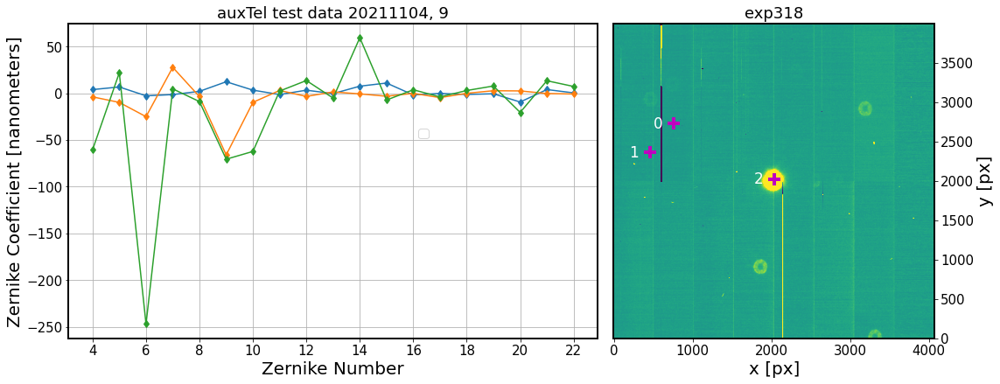

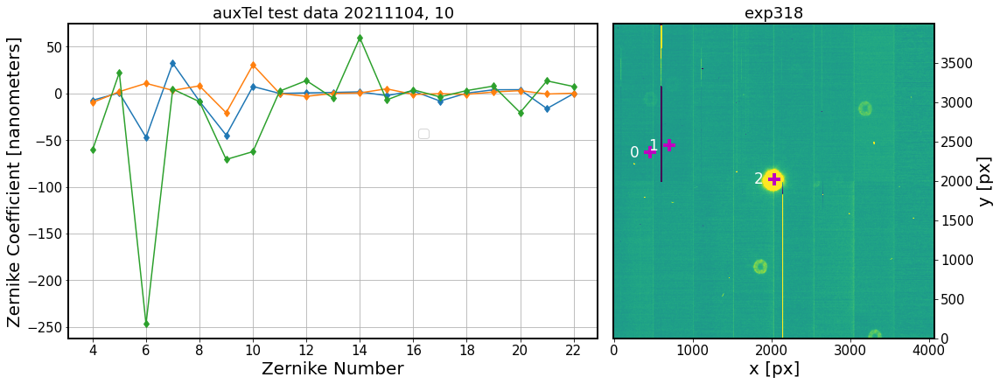

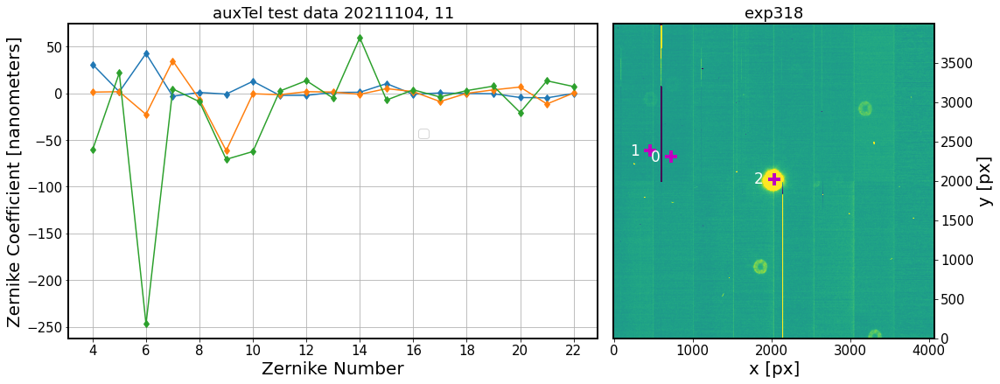

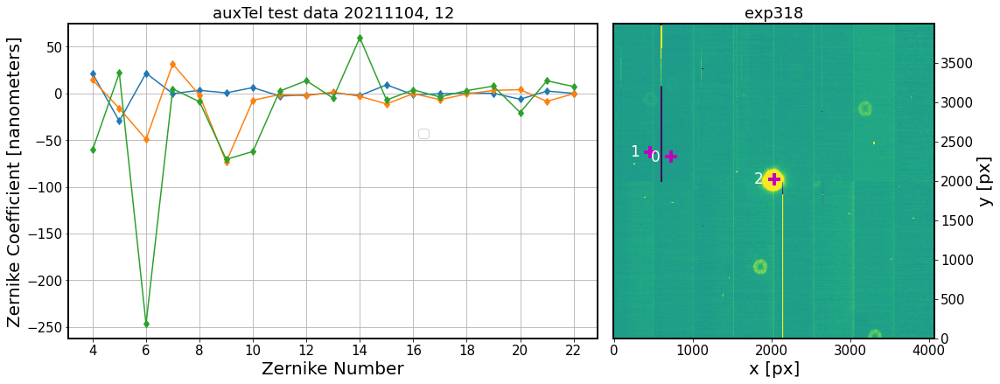

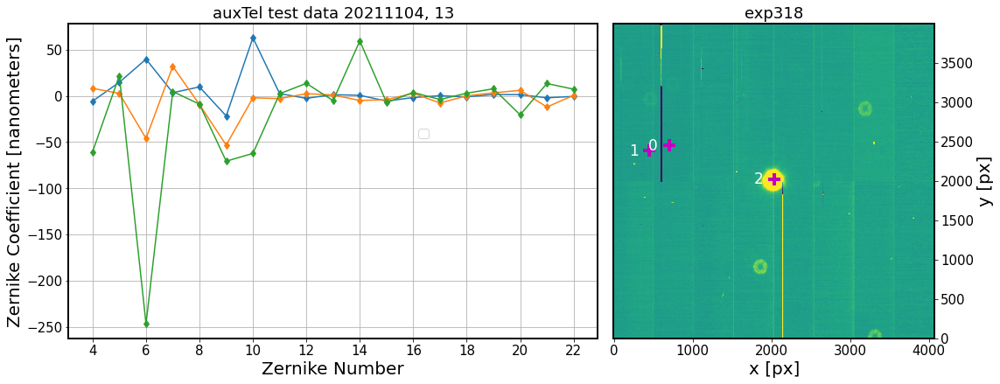

...

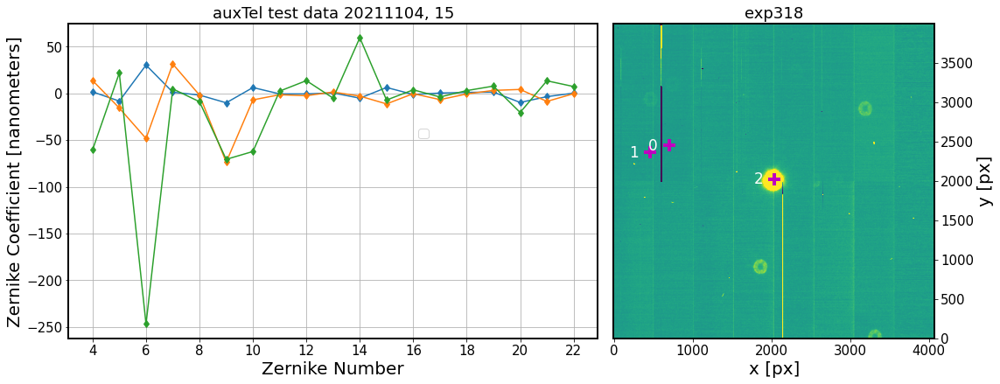

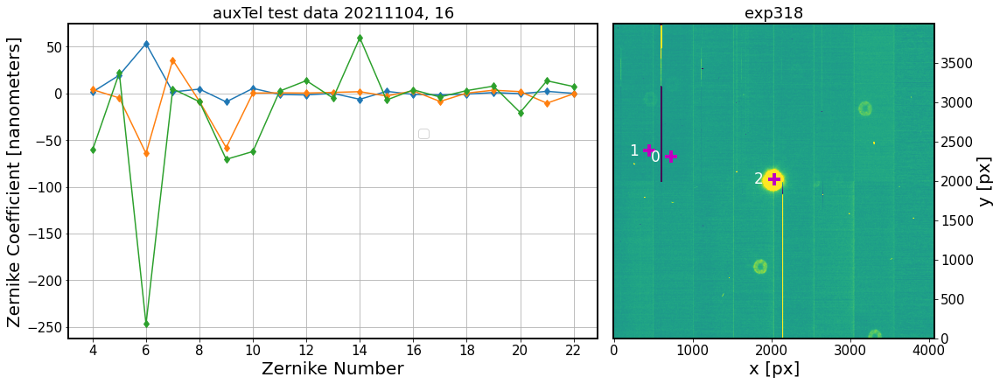

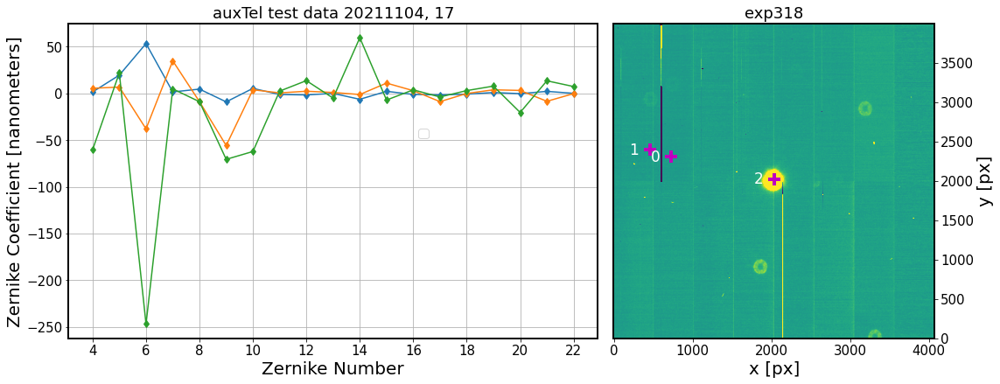

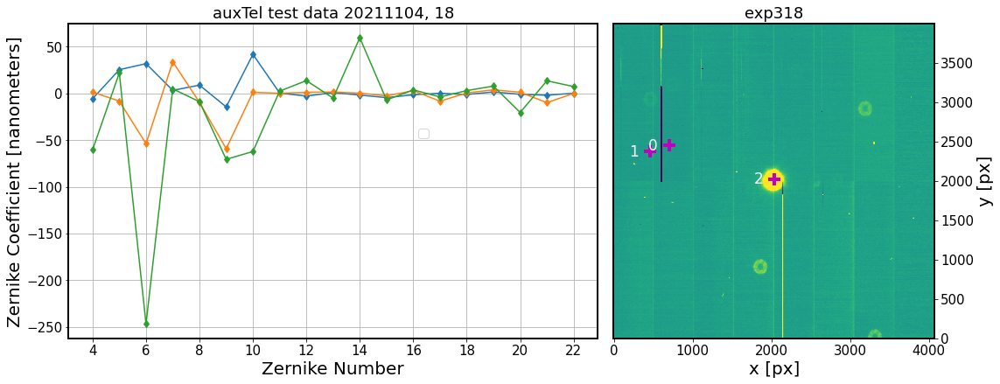

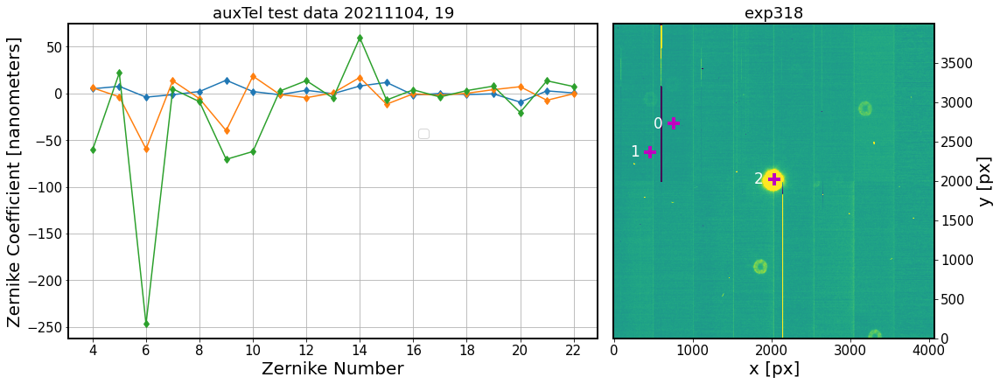

In [11]:
for i in range(9,20):
    exposure_intra = exps_intra[i]
    plot_zernike_image_comb(exposure_intra, i)

In [26]:
choose_donut={0:0, 1:1, 2:2, 3:2, 4:2, 5:2, 6:2, 7:2 ,8:2, 9:2, 10:2, 11:2, 12:2, 
              13:2, 14:2, 15:2, 16:2, 17:2, 18:2, 19:2, 20:2}



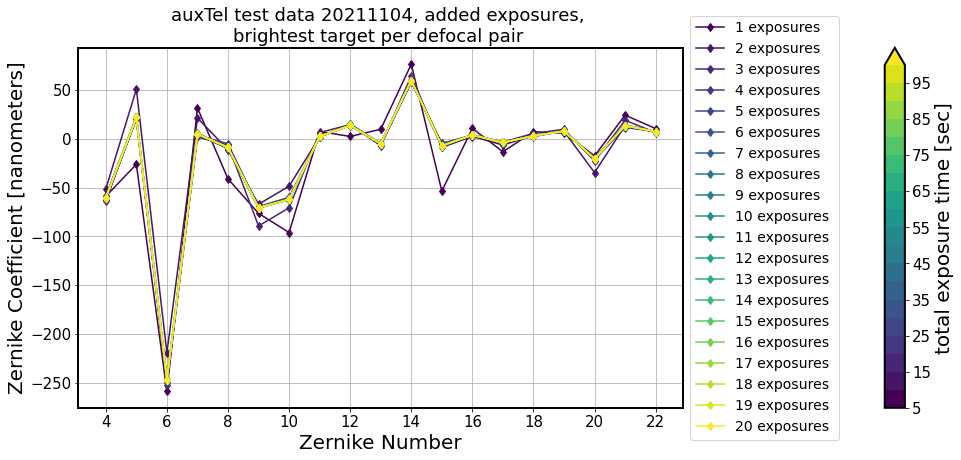

In [28]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval
import matplotlib.lines as mlines
from matplotlib import rcParams 
import matplotlib as mpl 

rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18


# plot the figure ...   
fig = plt.figure(figsize=(14, 5))

year='2021'
monthDay='1104'
    
####################################
### left - plot the fit results  ###
#################################### 

#add_axes([xmin,ymin,dx,dy]) 
ax1 = fig.add_axes([0,0,0.6,1])  

nlines = len(exps_intra)
color_idx = np.linspace(0, 1, nlines)
ax_legend_handles = []
i = 0 
cmap = plt.cm.viridis
for k in range(len(exps_intra)):
    zkResultsFile = f'zerDic_{year}{monthDay}_comb_{k}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    # plot zernikes only for the 0th donut. 
    # based on the above images, it is the brightest one 
    donutId = choose_donut[k]
    color = cmap(color_idx[i])
    ax1.plot(np.arange(4, 23),1000*zkFit['outputZernikesRaw'][donutId], '-d', color=color,
            label=f'{k+1} exposures ')
    line = mlines.Line2D([], [], color=color, ls='-', marker='o', alpha=1,
                                 )
    ax_legend_handles.append(f'{k+1} ')
    i += 1 

ax1.set_xlabel('Zernike Number',)
ax1.set_ylabel('Zernike Coefficient [nanometers]', )
ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[1, 0.5],ncol=1)

ax1.set_xticks(np.arange(4,23)[::2])
ax1.grid()
ax1.set_title(f'auxTel test data {year}{monthDay}, added exposures, \nbrightest target per defocal pair ', fontsize=18)

exptime = np.arange(1,21)*5
bounds = exptime
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='max')

#add_axes([xmin,ymin,dx,dy]) 
cax = fig.add_axes([0.8,0,0.02,1])
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=cax, orientation='vertical',
             label="total exposure time [sec]")

Change that plot to what difference do we see as we approach the final combined image:

/tmp/ipykernel_3782883/3636195470.py:36: RuntimeWarning: divide by zero encountered in log10
  ax1.plot(np.arange(4, 23),np.log10(abs(relative)), '-d', color=color,


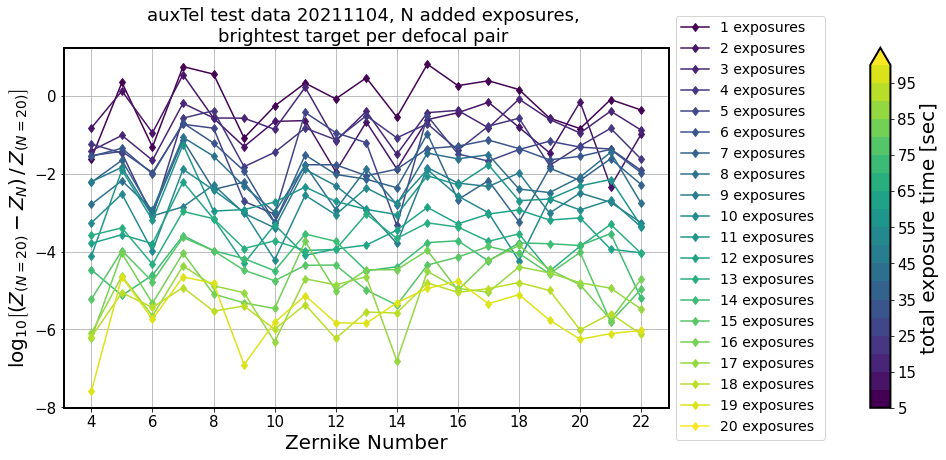

In [45]:
# store the result for final Zk 
k=19
zkResultsFile = f'zerDic_{year}{monthDay}_comb_{k}.npy'
zkFit = np.load(zkResultsFile, allow_pickle=True).item()
donutId = choose_donut[k]   
finalZernikes = 1000*zkFit['outputZernikesRaw'][donutId]

fig = plt.figure(figsize=(14, 5))

year='2021'
monthDay='1104'
    
####################################
### left - plot the fit results  ###
#################################### 

#add_axes([xmin,ymin,dx,dy]) 
ax1 = fig.add_axes([0,0,0.6,1])  

nlines = len(exps_intra)
color_idx = np.linspace(0, 1, nlines)
ax_legend_handles = []
i = 0 
cmap = plt.cm.viridis
for k in range(len(exps_intra)):
    zkResultsFile = f'zerDic_{year}{monthDay}_comb_{k}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    # plot zernikes only for the 0th donut. 
    # based on the above images, it is the brightest one 
    donutId = choose_donut[k]
    color = cmap(color_idx[i])
    kthZernikes = 1000*zkFit['outputZernikesRaw'][donutId]
    difference = finalZernikes  - kthZernikes
    relative = difference / finalZernikes
    ax1.plot(np.arange(4, 23),np.log10(abs(relative)), '-d', color=color,
            label=f'{k+1} exposures ')
    line = mlines.Line2D([], [], color=color, ls='-', marker='o', alpha=1,
                                 )
    ax_legend_handles.append(f'{k+1} ')
    i += 1 

ax1.set_xlabel('Zernike Number',)
ax1.set_ylabel(r'$\log_{10}{\left[\left(Z_{(N=20)}-Z_{N}\right)\,/\,Z_{(N=20)}\right]}$', )
ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[1, 0.5],ncol=1)

ax1.set_xticks(np.arange(4,23)[::2])
ax1.grid()
ax1.set_title(f'auxTel test data {year}{monthDay}, N added exposures, \nbrightest target per defocal pair ', fontsize=18)

exptime = np.arange(1,21)*5
bounds = exptime
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='max')

#add_axes([xmin,ymin,dx,dy]) 
cax = fig.add_axes([0.8,0,0.02,1])
fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
             cax=cax, orientation='vertical',
             label="total exposure time [sec]")

This shows that as we combine the exposures, the difference between zernikes derived from the N combined exposures vs total stack of 20 exposures diminishes in a logarithmic fashion. 

In [19]:
import galsim
import numpy as np
zDicAnnular = {}
zDicList4_37 = []
for j in range(4, 37):
    z = galsim.zernike.Zernike([0]*j+[1], R_inner=0.61)
    zkAnnular = np.sqrt(np.sum(z.gradX.coef**2) + np.sum(z.gradY.coef**2))
    zDicAnnular[j] =  zkAnnular
    zDicList4_37.append(zkAnnular)
    print(f"{j:>2}   {zkAnnular:>6.3f}")

 4    9.139
 5    3.302
 6    3.302
 7    9.971
 8    9.971
 9    4.818
10    4.818
11   20.436
12   11.406
13   11.406
14    6.286
15    6.286
16   21.359
17   21.359
18   13.259
19   13.259
20    7.729
21    7.729
22   34.196
23   22.748
24   22.748
25   15.374
26   15.374
27    9.158
28    9.158
29   35.220
30   35.220
31   24.523
32   24.523
33   17.645
34   17.645
35   10.580
36   10.580


In [21]:
len(zDicList4_37[:19])

19

In [23]:
rms = zDicList4_37[:19]

In [24]:
rms

[9.139196602279338,
 3.301526166168794,
 3.301526166168794,
 9.97064360614345,
 9.970643606143446,
 4.817513223742869,
 4.817513223742869,
 20.43586486243172,
 11.40553281059747,
 11.405532810597476,
 6.286099629011046,
 6.286099629011046,
 21.359491865251066,
 21.359491865251023,
 13.25857787595336,
 13.258577875953359,
 7.72855354839792,
 7.72855354839792,
 34.195742476097635]

Text(0.5, 1.0, 'exp494')

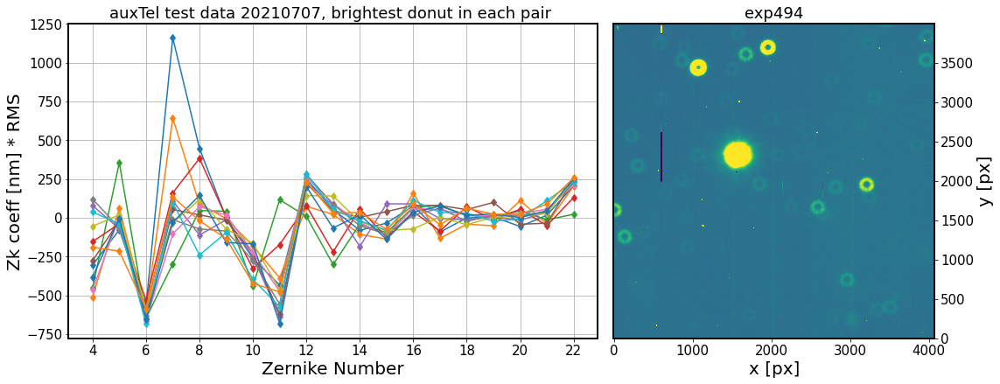

In [27]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18



expIntra = [464, 466, 468, 470, 473, 476, 479, 482, 485, 488, 491, 494]
brightDonutId = {464:0, 466:0, 468:0, 470:0, 473:0, 476:0, 
                 479:1, 482:0, 485:0, 488:0, 491:0, 494:0 
                }

# plot the figure ...   
fig = plt.figure(figsize=(14, 5))

####################################
### left - plot the fit results  ###
#################################### 

#add_axes([xmin,ymin,dx,dy]) 
ax1 = fig.add_axes([0,0,0.6,1])  

for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}00{exp}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    donutId = brightDonutId[exp]
    zk  = 1000*zkFit['outputZernikesRaw'][donutId]
    rms = zDicList4_37[:19]
    ax1.plot(np.arange(4, 23),zk*rms, 
             '-d', label=f'exp {exp}-{exp+1}, ')

ax1.set_xlabel('Zernike Number',)
ax1.set_ylabel('Zk coeff [nm] * RMS', )
# ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.4, 0.2],ncol=2)
ax1.set_xticks(np.arange(4,23)[::2])
ax1.grid()
ax1.set_title(f'auxTel test data {year}{monthDay}, brightest donut in each pair ', fontsize=18)


###############################################
### right - plot the postISR image ###
###############################################
ax2 = fig.add_axes([0.6,0,0.4,1])
butler = dafButler.Butler('/repo/main/')
datasetRefOrType='postISRCCD'; collection='u/scichris/Latiss/postISRtest'
exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{exp}')
                                                }, collections=[collection])
zscale = ZScaleInterval()
data = exposure_intra.image.array
vmin, vmax = zscale.get_limits(data)

ax2.imshow(data, origin='lower', vmin=vmin, vmax=vmax)
 
ax2.yaxis.tick_right()
ax2.set_xlabel('x [px]')
ax2.set_ylabel('y [px]')
ax2.yaxis.set_label_position("right")
ax2.set_title(f'exp{exp}')

Plot zernike squared, which would be the contribution to variance:

Text(0.5, 1.0, 'exp494')

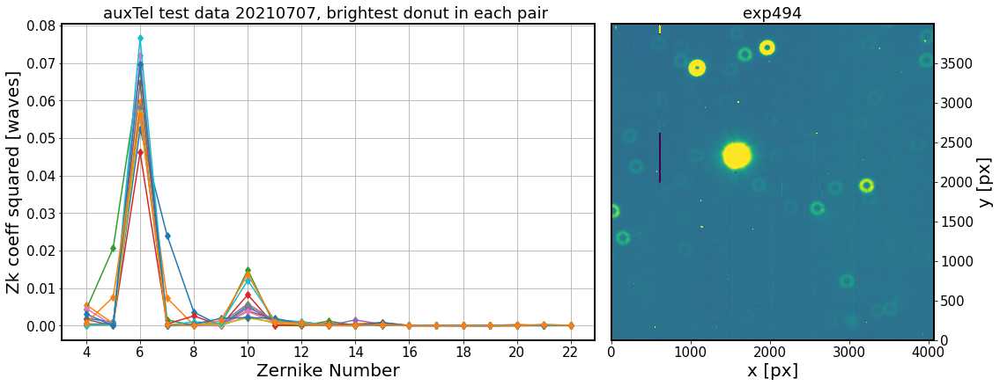

In [3]:
# plot the truth vs simulation... 
from lsst.daf import butler as dafButler
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from lsst.ts.wep.Utility import DefocalType
from lsst.ts.wep.DonutDetector import DonutDetector
from copy import copy
import yaml
from astropy.io import fits  
from astropy.visualization import ZScaleInterval

from matplotlib import rcParams 
rcParams['ytick.labelsize'] = 15
rcParams['xtick.labelsize'] = 15
rcParams['axes.labelsize'] = 20
rcParams['axes.linewidth'] = 2
rcParams['font.size'] = 15
rcParams['axes.titlesize'] = 18



year='2021'
monthDay='0707'
expIntra = [464, 466, 468, 470, 473, 476, 479, 482, 485, 488, 491, 494]
brightDonutId = {464:0, 466:0, 468:0, 470:0, 473:0, 476:0, 
                 479:1, 482:0, 485:0, 488:0, 491:0, 494:0 
                }

# plot the figure ...   
fig = plt.figure(figsize=(14, 5))

####################################
### left - plot the fit results  ###
#################################### 

#add_axes([xmin,ymin,dx,dy]) 
ax1 = fig.add_axes([0,0,0.6,1])  

for exp in expIntra:
    zkResultsFile = f'zerDic_{year}{monthDay}00{exp}.npy'
    zkFit = np.load(zkResultsFile, allow_pickle=True).item()

    donutId = brightDonutId[exp]
    zkNm  = 1000*zkFit['outputZernikesRaw'][donutId]
    zkWaves = zkNm / 750
    zkSquared = np.square(zkWaves)
    #rms = zDicList4_37[:19]
    ax1.plot(np.arange(4, 23),zkSquared, 
             '-d', label=f'exp {exp}-{exp+1}, ')

ax1.set_xlabel('Zernike Number',)
ax1.set_ylabel('Zk coeff squared [waves]', )
# ax1.legend(fontsize=14, loc='center left', bbox_to_anchor=[.4, 0.2],ncol=2)
ax1.set_xticks(np.arange(4,23)[::2])
ax1.grid()
ax1.set_title(f'auxTel test data {year}{monthDay}, brightest donut in each pair ', fontsize=18)


###############################################
### right - plot the postISR image ###
###############################################
ax2 = fig.add_axes([0.6,0,0.4,1])
butler = dafButler.Butler('/repo/main/')
datasetRefOrType='postISRCCD'; collection='u/scichris/Latiss/postISRtest'
exposure_intra = butler.get(datasetRefOrType, dataId={'instrument':'LATISS', 'detector':0, 
                                             'exposure':int(f'{year}{monthDay}00{exp}')
                                                }, collections=[collection])
zscale = ZScaleInterval()
data = exposure_intra.image.array
vmin, vmax = zscale.get_limits(data)

ax2.imshow(data, origin='lower', vmin=vmin, vmax=vmax)
 
ax2.yaxis.tick_right()
ax2.set_xlabel('x [px]')
ax2.set_ylabel('y [px]')
ax2.yaxis.set_label_position("right")
ax2.set_title(f'exp{exp}')